In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
# remove pandas colomn limit
pd.set_option('display.max_columns', None)


<!-- * Im going to create one data frame with all the points and features and then I will cluster them for each segement using a time series aproch -->

* then i will use r the second data frame where it have a row for each segment , with speed acceleration and other features and their mean , median , MAX , MIN and std to do a clustering based on driving behavior

<!-- * and i will use that second dataframe to do a clustering based on driving behavior ,  -->

* then i will try to find a meaning those clusters have. then for the training dataset i have to train a clasifire that will predict the cluster of each future segment

* then using those data i will pridict the arrival time.

* if that was not enough i will train a regression model to predict the speed , acceleration and other features for each new upcoming segemnt, and then i will use that to predict the arrival time


In [2]:
# import csv DataOut\bus_running_times_feature_added_all_moddedDF.csv
running_time_features = pd.read_csv('../DataOut/bus_running_times_feature_added_all_moddedDF.csv')
# read csv DataOut\bus_trip_all_points_moddedDF.csv 
bus_trip_speed_and_other_features = pd.read_csv('../DataOut/bus_trip_all_points_with_acceleration_and_radial_acceleration_and_distance_and_accDiff.csv')

In [3]:
# # select a random set of 10 trip ids , sed a known seed for reproducibility
# np.random.seed(42)
# trip_ids = np.random.choice(bus_trip_speed_and_other_features.trip_id.unique(), 10, replace=False)
# # select only the trips with the selected trip ids
# bus_trip_speed_and_other_features = bus_trip_speed_and_other_features[bus_trip_speed_and_other_features.trip_id.isin(trip_ids)]
# running_time_features= running_time_features[running_time_features.trip_id.isin(trip_ids)]
# # reset the index
# bus_trip_speed_and_other_features.reset_index(drop=True, inplace=True)
# running_time_features.reset_index(drop=True, inplace=True)

# trip_ids

In [4]:
# running_time_features=running_time_features[running_time_features['trip_id'].isin(trip_ids)]
# bus_trip_speed_and_other_features=bus_trip_speed_and_other_features[bus_trip_speed_and_other_features['trip_id'].isin(trip_ids)]

In [5]:
useless_features=['id','geometry','count',]
bus_trip_speed_and_other_features=bus_trip_speed_and_other_features.drop(useless_features,axis=1)

In [6]:
bus_trip_speed_and_other_features

,deviceid,devicetime,latitude,longitude,speed,date,time,bus_stop,trip_id,direction,acceleration,radial_acceleration,distance_from_start,time_diff,acc_diff,acceleration_der
0,116,2021-10-16 08:03:19,7.293068,80.636430,14.03890,2021-10-16,08:03:19,NaN,2.0,1,0.323975,0.000000,0.000000,NaN,NaN,0.000000
1,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,NaN,2.0,1,-0.251980,1.278067,123.738485,0 days 00:00:15,-0.575955,-0.038397
2,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,NaN,2.0,1,-0.179987,0.722300,163.044397,0 days 00:00:15,0.071993,0.004800
3,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,NaN,2.0,1,-0.251980,0.048332,211.472339,0 days 00:00:15,-0.071993,-0.004800
4,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,101,2.0,1,0.359971,1.052222,287.492821,0 days 00:00:15,0.611951,0.040797
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4034419,1719,2022-02-25 16:47:53,7.291572,80.635452,2.15983,2022-02-25,16:47:53,NaN,15890.0,2,0.215983,0.714925,16242.694984,0 days 00:00:10,2.105833,0.210583
4034420,1719,2022-02-25 16:47:57,7.291587,80.635355,2.15983,2022-02-25,16:47:57,NaN,15890.0,2,0.000000,0.003500,16253.479312,0 days 00:00:04,-0.215983,-0.053996
4034421,1719,2022-02-25 16:48:02,7.291597,80.635293,3.77970,2022-02-25,16:48:02,NaN,15890.0,2,0.323974,1.320196,16260.374802,0 days 00:00:05,0.323974,0.064795
4034422,1719,2022-02-25 16:48:03,7.291605,80.635280,3.77970,2022-02-25,16:48:03,NaN,15890.0,2,0.000000,0.128080,16262.113859,0 days 00:00:01,-0.323974,-0.323974


In [7]:
running_time_features

,trip_id,deviceid,direction,segment,date,start_time,end_time,run_time,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,conditions,dt(n-1)
0,4890.0,262.0,1.0,1.0,2021-10-01,06:39:49,06:40:58,0 days 00:01:09,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
1,4890.0,262.0,1.0,2.0,2021-10-01,06:42:12,06:45:42,0 days 00:03:30,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,74.0
2,4890.0,262.0,1.0,3.0,2021-10-01,06:45:42,06:53:58,0 days 00:08:16,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
3,4890.0,262.0,1.0,4.0,2021-10-01,06:54:04,06:57:19,0 days 00:03:15,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,6.0
4,4890.0,262.0,1.0,5.0,2021-10-01,06:57:19,06:58:56,0 days 00:01:37,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197627,3462.0,123.0,2.0,28.0,2022-10-31,18:45:44,18:47:23,0:01:39,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,9.0
197628,3462.0,123.0,2.0,29.0,2022-10-31,18:47:38,18:50:23,0:02:45,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0
197629,3462.0,123.0,2.0,30.0,2022-10-31,18:50:56,18:56:33,0:05:37,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,33.0
197630,3462.0,123.0,2.0,31.0,2022-10-31,18:56:48,18:57:34,0:00:46,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0


In [8]:
#print unique set of trip ids where direction is equal to 2
print(running_time_features[running_time_features['direction']==2]['trip_id'].unique())

[6540. 2369. 4891. ... 4889. 5906. 3462.]


Insert segment column 

In [9]:
# set Nan values in bus_stop column to 0
bus_trip_speed_and_other_features['bus_stop']=bus_trip_speed_and_other_features['bus_stop'].fillna(0)

In [10]:
ayyas_df = pd.read_csv('../DataOut/bus_running_times_feature_added_all_moddedDF.csv')

In [11]:

# bus_trip_speed_and_other_features['segment'] = 0
# for x in bus_trip_speed_and_other_features.trip_id.unique():
#     df = bus_trip_speed_and_other_features[bus_trip_speed_and_other_features['trip_id'] == x]
#     ayyas_tid_df = ayyas_df[ayyas_df['trip_id'] == x]

#     for index, row in df.iterrows():
#         for index2, row2 in ayyas_tid_df.iterrows():
#             # print(row)
#             print_counter = 0
#             # Check if 'start_time' and 'end_time' are not null (not missing values)
#             if pd.notna(row2['start_time']) and pd.notna(row2['end_time']):
#                 if row2['start_time'] <= row['time'] and row['time'] <= row2['end_time']:
#                     bus_trip_speed_and_other_features.loc[index, 'segment'] = row2['segment']
#                     break
                        

In [12]:
# bus_trip_speed_and_other_features

In [13]:
# # bus_trip_speed_and_other_features save to csv 
# bus_trip_speed_and_other_features.to_csv('../DataOut/bus_trip_speed_and_other_features.csv', index=False)

In [14]:
# open bus_trip_speed_and_other_features csv
bus_trip_speed_and_other_features= pd.read_csv('../DataOut/bus_trip_speed_and_other_features.csv')

In [15]:
bus_trip_speed_and_other_features

,deviceid,devicetime,latitude,longitude,speed,date,time,bus_stop,trip_id,direction,acceleration,radial_acceleration,distance_from_start,time_diff,acc_diff,acceleration_der,segment
0,116,2021-10-16 08:03:19,7.293068,80.636430,14.03890,2021-10-16,08:03:19,0,2.0,1,0.323975,0.000000,0.000000,NaN,NaN,0.000000,1
1,116,2021-10-16 08:03:34,7.293043,80.637552,10.25920,2021-10-16,08:03:34,0,2.0,1,-0.251980,1.278067,123.738485,0 days 00:00:15,-0.575955,-0.038397,1
2,116,2021-10-16 08:03:49,7.292725,80.637707,7.55940,2021-10-16,08:03:49,0,2.0,1,-0.179987,0.722300,163.044397,0 days 00:00:15,0.071993,0.004800,1
3,116,2021-10-16 08:04:04,7.292292,80.637663,3.77970,2021-10-16,08:04:04,0,2.0,1,-0.251980,0.048332,211.472339,0 days 00:00:15,-0.071993,-0.004800,1
4,116,2021-10-16 08:04:19,7.291640,80.637455,9.17927,2021-10-16,08:04:19,101,2.0,1,0.359971,1.052222,287.492821,0 days 00:00:15,0.611951,0.040797,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4034419,1719,2022-02-25 16:47:53,7.291572,80.635452,2.15983,2022-02-25,16:47:53,0,15890.0,2,0.215983,0.714925,16242.694984,0 days 00:00:10,2.105833,0.210583,0
4034420,1719,2022-02-25 16:47:57,7.291587,80.635355,2.15983,2022-02-25,16:47:57,0,15890.0,2,0.000000,0.003500,16253.479312,0 days 00:00:04,-0.215983,-0.053996,0
4034421,1719,2022-02-25 16:48:02,7.291597,80.635293,3.77970,2022-02-25,16:48:02,0,15890.0,2,0.323974,1.320196,16260.374802,0 days 00:00:05,0.323974,0.064795,0
4034422,1719,2022-02-25 16:48:03,7.291605,80.635280,3.77970,2022-02-25,16:48:03,0,15890.0,2,0.000000,0.128080,16262.113859,0 days 00:00:01,-0.323974,-0.323974,0


# TS cluster segemnts

In [16]:
# df_for_seg_ts_clustering = bus_trip_speed_and_other_features[['trip_id','segment','time','distance_from_start','speed','acceleration','radial_acceleration','acceleration_der']]
# # drop rows where segment is 0
# df_for_seg_ts_clustering = df_for_seg_ts_clustering[df_for_seg_ts_clustering['segment'] != 0]
# df_for_seg_ts_clustering

In [17]:
# import pandas as pd

# # Assuming df_for_seg_ts_clustering is your DataFrame

# # Convert the 'time' column to datetime objects
# df_for_seg_ts_clustering['time'] = pd.to_datetime(df_for_seg_ts_clustering['time'], format='%H:%M:%S')

# # Group by 'trip_id' and 'segment'
# grouped = df_for_seg_ts_clustering.groupby(['trip_id', 'segment'])

# # Define a function to calculate the time difference in seconds within each group
# def calculate_time_diff(group):
#     group['time'] = (group['time'] - group['time'].min()).dt.total_seconds().astype(int)
#     return group

# # Apply the function to each group and concatenate the results
# df_for_seg_ts_clustering = grouped.apply(calculate_time_diff)


In [18]:
# # Print the resulting DataFrame
# df_for_seg_ts_clustering[df_for_seg_ts_clustering['trip_id'] == 476].head(50)

In [19]:
# df_for_seg_ts_clustering=df_for_seg_ts_clustering.drop(['trip_id','segment'],axis=1)
# df_for_seg_ts_clustering=df_for_seg_ts_clustering.reset_index()
# # drop level_2 column
# df_for_seg_ts_clustering = df_for_seg_ts_clustering.drop('level_2',axis=1)


In [20]:
# # Group by 'segment' and calculate the maximum time in seconds for each segment within each trip_id
# grouped = df_for_seg_ts_clustering.groupby(['segment', 'trip_id'])['time'].max()

# # Calculate the average total time length for each segment
# segment_avg_times = grouped.groupby('segment').mean()

# # Round the mean value to the nearest 15th multiplier integer
# segment_avg_times_rounded = (segment_avg_times / 15).round() * 15 

# # Convert the result to a dictionary
# segment_avg_times_dict = segment_avg_times_rounded.to_dict()

# # Print the dictionary
# print(segment_avg_times_dict)


In [21]:
# df_for_seg_ts_clustering

In [22]:
# import pandas as pd
# import numpy as np

# # Assuming df_for_seg_ts_clustering is your DataFrame with the time adjustments
# # Assuming segment_avg_times_dict is the dictionary of rounded average times you calculated earlier

# # Create an empty list to store dictionaries of rows
# adjusted_rows = []

# for tid in df_for_seg_ts_clustering['trip_id'].unique():
#     for seg in df_for_seg_ts_clustering[df_for_seg_ts_clustering['trip_id'] == tid]['segment'].unique():
#         # Iterate through i by steps of 15 from 0 to the maximum time in seconds for the segment
#         for i in range(0, int(segment_avg_times_dict[seg])+15, 15):
#             # Check if the row in df_for_seg_ts_clustering where trip_id is equal to tid, segment is equal to seg, and time is equal to i exists
#             if df_for_seg_ts_clustering[(df_for_seg_ts_clustering['trip_id'] == tid) & (df_for_seg_ts_clustering['segment'] == seg) & (df_for_seg_ts_clustering['time'] == i)].shape[0] > 0:
#                 # Append the row to the list of adjusted rows
#                 adjusted_rows.append(df_for_seg_ts_clustering[(df_for_seg_ts_clustering['trip_id'] == tid) & (df_for_seg_ts_clustering['segment'] == seg) & (df_for_seg_ts_clustering['time'] == i)].iloc[0].to_dict())
#             else:
#                 # Create a new dictionary with the same trip_id, segment, and time equal to i and append it to the list of adjusted rows
#                 adjusted_rows.append({'trip_id': tid, 'segment': seg, 'time': i})

# # Create a DataFrame from the list of dictionaries
# adjusted_df = pd.DataFrame(adjusted_rows)

# # Sort the adjusted DataFrame
# adjusted_df.sort_values(by=['trip_id', 'segment', 'time'], inplace=True)

# # Reset the index
# adjusted_df.reset_index(drop=True, inplace=True)

# # Print the adjusted DataFrame
# adjusted_df

In [23]:
# # save adjestted_df to  a csv
# adjusted_df.to_csv('../DataOut/adjusted_df.csv',index=False)

In [24]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Assuming you have a DataFrame named 'adjusted_df' that contains your data

# # Filter the DataFrame for segment 2
# segment_2_data = adjusted_df[adjusted_df['segment'] == 2]

# # Group the data by 'trip_id'
# grouped_data = segment_2_data.groupby('trip_id')

# # Create a figure and axis for the plot
# fig, ax = plt.subplots(figsize=(10, 6))

# # Iterate through each group (trip_id) and plot speed vs. time
# for trip_id, group in grouped_data:
#     ax.plot(group['time'], group['speed'], label=f'Trip {trip_id}')

# # Set labels and title
# ax.set_xlabel('Time (seconds)')
# ax.set_ylabel('Speed')
# ax.set_title('Speed vs. Time for Segment 2')

# # Add a legend
# ax.legend()

# # Show the plot
# plt.grid()
# plt.show()


# Segment wise clustering

In [25]:
# Define the count_local_maxima_and_minima function
def count_local_maxima_and_minima(data):
    max_count = 0
    min_count = 0
    for i in range(1, len(data) - 1):
        if data['acceleration_der'].iloc[i] > data['acceleration_der'].iloc[i - 1] and \
           data['acceleration_der'].iloc[i] > data['acceleration_der'].iloc[i + 1] and \
           data['acceleration_der'].iloc[i] > 0.01:
            max_count += 1
        elif data['acceleration_der'].iloc[i] < data['acceleration_der'].iloc[i - 1] and \
             data['acceleration_der'].iloc[i] < data['acceleration_der'].iloc[i + 1] and \
             data['acceleration_der'].iloc[i] < -0.025:
            min_count += 1
    return max_count, min_count

# Group the data by 'segment' and 'trip_id' and apply the count_local_maxima_and_minima function to 'acceleration_der'
breaks_and_throttles = bus_trip_speed_and_other_features.groupby(['trip_id', 'deviceid', 'segment']).apply(count_local_maxima_and_minima)

# Convert the results into a DataFrame
breaks_and_throttles = breaks_and_throttles.apply(pd.Series)

# Reset the index to make 'trip_id', 'deviceid', and 'segment' regular columns
breaks_and_throttles = breaks_and_throttles.reset_index()

# Rename the columns for clarity
breaks_and_throttles.columns = ['trip_id', 'deviceid', 'segment', 'throttle_count', 'break_count']

# The 'segment_maxima_minima_counts' DataFrame now contains the counts of local maxima and minima of 'acceleration_der' in each segment and trip_id
print(breaks_and_throttles)


        trip_id  deviceid  segment  throttle_count  break_count
0           1.0       116        0               4            0
1           1.0       116       21               6            5
2           1.0       116       22               1            2
3           1.0       116       23               3            3
4           1.0       116       24               3            4
...         ...       ...      ...             ...          ...
207381  15891.0      1719       11              35           35
207382  15891.0      1719       12              33           35
207383  15891.0      1719       13              35           37
207384  15891.0      1719       14              24           26
207385  15891.0      1719       15              62           65

[207386 rows x 5 columns]


In [26]:
# bus_trip_speed_and_other_featuresdrop rows with segment 0
bus_trip_speed_and_other_features = bus_trip_speed_and_other_features[bus_trip_speed_and_other_features['segment'] != 0]
# drop unneeded columns
bus_trip_speed_and_other_features = bus_trip_speed_and_other_features.drop(['latitude','longitude','date','time','bus_stop','time_diff','acc_diff','distance_from_start','devicetime'],axis=1)
# re order columns
bus_trip_speed_and_other_features = bus_trip_speed_and_other_features[['trip_id','segment','deviceid','speed','acceleration','radial_acceleration','acceleration_der']]

bus_trip_speed_and_other_features

,trip_id,segment,deviceid,speed,acceleration,radial_acceleration,acceleration_der
0,2.0,1,116,14.03890,0.323975,0.000000,0.000000
1,2.0,1,116,10.25920,-0.251980,1.278067,-0.038397
2,2.0,1,116,7.55940,-0.179987,0.722300,0.004800
3,2.0,1,116,3.77970,-0.251980,0.048332,-0.004800
4,2.0,1,116,9.17927,0.359971,1.052222,0.040797
...,...,...,...,...,...,...,...
4034404,15890.0,34,1719,7.55940,-0.359970,0.286957,-0.479960
4034405,15890.0,34,1719,7.01944,-0.269980,1.196474,0.044995
4034406,15890.0,34,1719,5.39957,-0.809935,1.022045,-0.269978
4034407,15890.0,34,1719,5.39957,0.000000,0.938451,0.404968


In [27]:
# group bus_trip_speed_and_other_features by segment and trip_id, take the mean , standard deviation , min , max , median of each other column as seperate columns
bus_trip_speed_and_other_features_grpd = bus_trip_speed_and_other_features.groupby(['segment','trip_id']).agg({'deviceid':['median'],'speed':['mean','std','min','max','median'],'acceleration':['mean','std','min','max','median'],'radial_acceleration':['mean','std','min','max','median'],'acceleration_der':['mean','std','min','max','median']}).reset_index()

# bus_trip_speed_and_other_features_grpd=bus_trip_speed_and_other_features
bus_trip_speed_and_other_features_grpd

segment  trip_id deviceid      speed                               \
                          median       mean       std      min       max   
0            1      2.0    116.0   7.636540  4.554339  0.00000  14.03890   
1            1      4.0    116.0   5.519560  3.558986  0.00000   9.71923   
2            1      6.0    116.0   5.399570  3.488891  0.00000   9.71923   
3            1      8.0    116.0   6.599478  3.134288  0.00000  10.25920   
4            1     10.0    116.0   5.075596  3.221693  0.00000   9.71923   
...        ...      ...      ...        ...       ...      ...       ...   
193860      34  15883.0   1719.0  12.089044  2.973087  2.15983  16.19870   
193861      34  15885.0   1719.0  11.509089  2.177145  7.01944  16.73870   
193862      34  15886.0   1719.0   8.490629  2.662821  3.23974  16.19870   
193863      34  15888.0   1719.0   4.183115  2.408039  0.00000  10.25920   
193864      34  15890.0   1719.0   9.666118  4.211097  3.23974  18.35850   

                  acceleration                                          \
          median          mean       std       min       max    median   
0        8.63931 -8.742162e-02  0.335023 -0.575954  0.359971 -0.179987   
1        7.01944  0.000000e+00  0.339119 -0.539957  0.467963 -0.035997   
2        5.93953  0.000000e+00  0.377970 -0.647949  0.431965  0.071995   
3        7.01944 -5.599556e-02  0.140702 -0.287977  0.143990  0.000000   
4        5.39957 -1.110223e-17  0.304028 -0.323974  0.647949 -0.053996   
...          ...           ...       ...       ...       ...       ...   
193860  12.68900 -4.666414e-02  1.022163 -2.159830  2.699800  0.000000   
193861  11.87910 -6.999648e-02  0.829550 -1.619900  1.889850  0.000000   
193862   8.63931 -4.173580e-02  0.834787 -1.619900  2.159830  0.000000   
193863   4.31966 -3.035945e-02  0.787065 -3.239740  2.159825  0.000000   
193864  10.25920 -2.360269e-02  0.868470 -1.619900  1.619900  0.000000   

       radial_acceleration                                           \
                      mean       std       min        max    median   
0                 0.534319  0.528350  0.000000   1.278067  0.639311   
1                 0.302178  0.342921  0.000000   0.872557  0.092952   
2                 0.351493  0.520755  0.000000   1.506472  0.097039   
3                 0.294084  0.337139  0.000000   0.995937  0.117268   
4                 0.257264  0.403752  0.000000   1.040735  0.048050   
...                    ...       ...       ...        ...       ...   
193860            2.045085  1.766632  0.034733   8.032701  1.575438   
193861            1.625022  1.512265  0.006459   6.316962  1.203558   
193862            1.887558  2.069287  0.008645  11.242018  1.413202   
193863            1.053614  1.212462  0.000000   5.027488  0.571216   
193864            1.837936  1.819875  0.020957   7.728527  1.189167   

       acceleration_der                                          
                   mean       std       min       max    median  
0             -0.008571  0.027878 -0.038397  0.040797 -0.004800  
1             -0.001067  0.034446 -0.040797  0.057595 -0.016799  
2             -0.001333  0.042272 -0.047996  0.059995 -0.014399  
3             -0.002400  0.010732 -0.016799  0.019199 -0.002400  
4             -0.000240  0.031360 -0.052796  0.059995 -0.003600  
...                 ...       ...       ...       ...       ...  
193860        -0.033887  0.745066 -1.484875  2.699800  0.000000  
193861        -0.086661  1.004305 -2.969800  3.239800 -0.000001  
193862        -0.008912  0.939558 -2.429850  2.429815  0.000000  
193863        -0.033901  0.765954 -3.239740  2.564795  0.000000  
193864         0.085545  0.804425 -2.699850  2.699850  0.000028  

[193865 rows x 23 columns]

In [28]:
# dont have multi index columns
bus_trip_speed_and_other_features_grpd.columns = [' '.join(col).strip() for col in bus_trip_speed_and_other_features_grpd.columns.values]
# rename deviceid median to deviceid
bus_trip_speed_and_other_features_grpd.rename(columns={'deviceid median':'deviceid'}, inplace=True)
bus_trip_speed_and_other_features_grpd

,segment,trip_id,deviceid,speed mean,speed std,speed min,speed max,speed median,acceleration mean,acceleration std,acceleration min,acceleration max,acceleration median,radial_acceleration mean,radial_acceleration std,radial_acceleration min,radial_acceleration max,radial_acceleration median,acceleration_der mean,acceleration_der std,acceleration_der min,acceleration_der max,acceleration_der median
0,1,2.0,116.0,7.636540,4.554339,0.00000,14.03890,8.63931,-8.742162e-02,0.335023,-0.575954,0.359971,-0.179987,0.534319,0.528350,0.000000,1.278067,0.639311,-0.008571,0.027878,-0.038397,0.040797,-0.004800
1,1,4.0,116.0,5.519560,3.558986,0.00000,9.71923,7.01944,0.000000e+00,0.339119,-0.539957,0.467963,-0.035997,0.302178,0.342921,0.000000,0.872557,0.092952,-0.001067,0.034446,-0.040797,0.057595,-0.016799
2,1,6.0,116.0,5.399570,3.488891,0.00000,9.71923,5.93953,0.000000e+00,0.377970,-0.647949,0.431965,0.071995,0.351493,0.520755,0.000000,1.506472,0.097039,-0.001333,0.042272,-0.047996,0.059995,-0.014399
3,1,8.0,116.0,6.599478,3.134288,0.00000,10.25920,7.01944,-5.599556e-02,0.140702,-0.287977,0.143990,0.000000,0.294084,0.337139,0.000000,0.995937,0.117268,-0.002400,0.010732,-0.016799,0.019199,-0.002400
4,1,10.0,116.0,5.075596,3.221693,0.00000,9.71923,5.39957,-1.110223e-17,0.304028,-0.323974,0.647949,-0.053996,0.257264,0.403752,0.000000,1.040735,0.048050,-0.000240,0.031360,-0.052796,0.059995,-0.003600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193860,34,15883.0,1719.0,12.089044,2.973087,2.15983,16.19870,12.68900,-4.666414e-02,1.022163,-2.159830,2.699800,0.000000,2.045085,1.766632,0.034733,8.032701,1.575438,-0.033887,0.745066,-1.484875,2.699800,0.000000
193861,34,15885.0,1719.0,11.509089,2.177145,7.01944,16.73870,11.87910,-6.999648e-02,0.829550,-1.619900,1.889850,0.000000,1.625022,1.512265,0.006459,6.316962,1.203558,-0.086661,1.004305,-2.969800,3.239800,-0.000001
193862,34,15886.0,1719.0,8.490629,2.662821,3.23974,16.19870,8.63931,-4.173580e-02,0.834787,-1.619900,2.159830,0.000000,1.887558,2.069287,0.008645,11.242018,1.413202,-0.008912,0.939558,-2.429850,2.429815,0.000000
193863,34,15888.0,1719.0,4.183115,2.408039,0.00000,10.25920,4.31966,-3.035945e-02,0.787065,-3.239740,2.159825,0.000000,1.053614,1.212462,0.000000,5.027488,0.571216,-0.033901,0.765954,-3.239740,2.564795,0.000000


In [29]:
# left join breaks_and_throttles to bus_trip_speed_and_other_features_grpd using trip_id and segment as keys
bus_trip_speed_and_other_features_grpd = pd.merge(bus_trip_speed_and_other_features_grpd,breaks_and_throttles,how='left',on=['trip_id','segment','deviceid'])
bus_trip_speed_and_other_features_grpd

,segment,trip_id,deviceid,speed mean,speed std,speed min,speed max,speed median,acceleration mean,acceleration std,acceleration min,acceleration max,acceleration median,radial_acceleration mean,radial_acceleration std,radial_acceleration min,radial_acceleration max,radial_acceleration median,acceleration_der mean,acceleration_der std,acceleration_der min,acceleration_der max,acceleration_der median,throttle_count,break_count
0,1,2.0,116.0,7.636540,4.554339,0.00000,14.03890,8.63931,-8.742162e-02,0.335023,-0.575954,0.359971,-0.179987,0.534319,0.528350,0.000000,1.278067,0.639311,-0.008571,0.027878,-0.038397,0.040797,-0.004800,1,1
1,1,4.0,116.0,5.519560,3.558986,0.00000,9.71923,7.01944,0.000000e+00,0.339119,-0.539957,0.467963,-0.035997,0.302178,0.342921,0.000000,0.872557,0.092952,-0.001067,0.034446,-0.040797,0.057595,-0.016799,2,0
2,1,6.0,116.0,5.399570,3.488891,0.00000,9.71923,5.93953,0.000000e+00,0.377970,-0.647949,0.431965,0.071995,0.351493,0.520755,0.000000,1.506472,0.097039,-0.001333,0.042272,-0.047996,0.059995,-0.014399,3,3
3,1,8.0,116.0,6.599478,3.134288,0.00000,10.25920,7.01944,-5.599556e-02,0.140702,-0.287977,0.143990,0.000000,0.294084,0.337139,0.000000,0.995937,0.117268,-0.002400,0.010732,-0.016799,0.019199,-0.002400,1,0
4,1,10.0,116.0,5.075596,3.221693,0.00000,9.71923,5.39957,-1.110223e-17,0.304028,-0.323974,0.647949,-0.053996,0.257264,0.403752,0.000000,1.040735,0.048050,-0.000240,0.031360,-0.052796,0.059995,-0.003600,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193860,34,15883.0,1719.0,12.089044,2.973087,2.15983,16.19870,12.68900,-4.666414e-02,1.022163,-2.159830,2.699800,0.000000,2.045085,1.766632,0.034733,8.032701,1.575438,-0.033887,0.745066,-1.484875,2.699800,0.000000,14,16
193861,34,15885.0,1719.0,11.509089,2.177145,7.01944,16.73870,11.87910,-6.999648e-02,0.829550,-1.619900,1.889850,0.000000,1.625022,1.512265,0.006459,6.316962,1.203558,-0.086661,1.004305,-2.969800,3.239800,-0.000001,18,18
193862,34,15886.0,1719.0,8.490629,2.662821,3.23974,16.19870,8.63931,-4.173580e-02,0.834787,-1.619900,2.159830,0.000000,1.887558,2.069287,0.008645,11.242018,1.413202,-0.008912,0.939558,-2.429850,2.429815,0.000000,20,22
193863,34,15888.0,1719.0,4.183115,2.408039,0.00000,10.25920,4.31966,-3.035945e-02,0.787065,-3.239740,2.159825,0.000000,1.053614,1.212462,0.000000,5.027488,0.571216,-0.033901,0.765954,-3.239740,2.564795,0.000000,28,28


In [30]:
# check for null values
bus_trip_speed_and_other_features_grpd.isnull().sum()

segment                        0
trip_id                        0
deviceid                       0
speed mean                     0
speed std                     88
speed min                      0
speed max                      0
speed median                   0
acceleration mean              0
acceleration std              88
acceleration min               0
acceleration max               0
acceleration median            0
radial_acceleration mean       0
radial_acceleration std       88
radial_acceleration min        0
radial_acceleration max        0
radial_acceleration median     0
acceleration_der mean          0
acceleration_der std          88
acceleration_der min           0
acceleration_der max           0
acceleration_der median        0
throttle_count                 0
break_count                    0
dtype: int64

In [31]:
# drop nan
bus_trip_speed_and_other_features_grpd = bus_trip_speed_and_other_features_grpd.dropna()

In [32]:
# create a new feature with total break_count per segment
bus_trip_speed_and_other_features_grpd['total_break_count_per_segment'] = bus_trip_speed_and_other_features_grpd.groupby('segment')['break_count'].transform('sum')
bus_trip_speed_and_other_features_grpd

C:\Users\gw\AppData\Local\Temp\ipykernel_6648\1710480790.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bus_trip_speed_and_other_features_grpd['total_break_count_per_segment'] = bus_trip_speed_and_other_features_grpd.groupby('segment')['break_count'].transform('sum')


,segment,trip_id,deviceid,speed mean,speed std,speed min,speed max,speed median,acceleration mean,acceleration std,acceleration min,acceleration max,acceleration median,radial_acceleration mean,radial_acceleration std,radial_acceleration min,radial_acceleration max,radial_acceleration median,acceleration_der mean,acceleration_der std,acceleration_der min,acceleration_der max,acceleration_der median,throttle_count,break_count,total_break_count_per_segment
0,1,2.0,116.0,7.636540,4.554339,0.00000,14.03890,8.63931,-8.742162e-02,0.335023,-0.575954,0.359971,-0.179987,0.534319,0.528350,0.000000,1.278067,0.639311,-0.008571,0.027878,-0.038397,0.040797,-0.004800,1,1,17627
1,1,4.0,116.0,5.519560,3.558986,0.00000,9.71923,7.01944,0.000000e+00,0.339119,-0.539957,0.467963,-0.035997,0.302178,0.342921,0.000000,0.872557,0.092952,-0.001067,0.034446,-0.040797,0.057595,-0.016799,2,0,17627
2,1,6.0,116.0,5.399570,3.488891,0.00000,9.71923,5.93953,0.000000e+00,0.377970,-0.647949,0.431965,0.071995,0.351493,0.520755,0.000000,1.506472,0.097039,-0.001333,0.042272,-0.047996,0.059995,-0.014399,3,3,17627
3,1,8.0,116.0,6.599478,3.134288,0.00000,10.25920,7.01944,-5.599556e-02,0.140702,-0.287977,0.143990,0.000000,0.294084,0.337139,0.000000,0.995937,0.117268,-0.002400,0.010732,-0.016799,0.019199,-0.002400,1,0,17627
4,1,10.0,116.0,5.075596,3.221693,0.00000,9.71923,5.39957,-1.110223e-17,0.304028,-0.323974,0.647949,-0.053996,0.257264,0.403752,0.000000,1.040735,0.048050,-0.000240,0.031360,-0.052796,0.059995,-0.003600,1,2,17627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193860,34,15883.0,1719.0,12.089044,2.973087,2.15983,16.19870,12.68900,-4.666414e-02,1.022163,-2.159830,2.699800,0.000000,2.045085,1.766632,0.034733,8.032701,1.575438,-0.033887,0.745066,-1.484875,2.699800,0.000000,14,16,14205
193861,34,15885.0,1719.0,11.509089,2.177145,7.01944,16.73870,11.87910,-6.999648e-02,0.829550,-1.619900,1.889850,0.000000,1.625022,1.512265,0.006459,6.316962,1.203558,-0.086661,1.004305,-2.969800,3.239800,-0.000001,18,18,14205
193862,34,15886.0,1719.0,8.490629,2.662821,3.23974,16.19870,8.63931,-4.173580e-02,0.834787,-1.619900,2.159830,0.000000,1.887558,2.069287,0.008645,11.242018,1.413202,-0.008912,0.939558,-2.429850,2.429815,0.000000,20,22,14205
193863,34,15888.0,1719.0,4.183115,2.408039,0.00000,10.25920,4.31966,-3.035945e-02,0.787065,-3.239740,2.159825,0.000000,1.053614,1.212462,0.000000,5.027488,0.571216,-0.033901,0.765954,-3.239740,2.564795,0.000000,28,28,14205


## K means clustering

In [33]:
# standardize the data
# scaler = StandardScaler()

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# fit and transform the data
scaled_data = scaler.fit_transform(bus_trip_speed_and_other_features_grpd.drop(['trip_id','segment','deviceid'],axis=1))
# create a dataframe with the scaled data
scaled_data_df = pd.DataFrame(scaled_data,columns=bus_trip_speed_and_other_features_grpd.drop(['trip_id','segment','deviceid'],axis=1).columns)
scaled_data_df

,speed mean,speed std,speed min,speed max,speed median,acceleration mean,acceleration std,acceleration min,acceleration max,acceleration median,radial_acceleration mean,radial_acceleration std,radial_acceleration min,radial_acceleration max,radial_acceleration median,acceleration_der mean,acceleration_der std,acceleration_der min,acceleration_der max,acceleration_der median,throttle_count,break_count,total_break_count_per_segment
0,0.232804,0.248508,0.000000,0.164557,0.248062,0.649083,0.024207,0.980425,0.048197,0.796861,0.023174,0.004620,0.000000,0.000856,0.099446,0.641323,0.001494,0.999419,0.006273,0.826721,0.008333,0.008772,0.167092
1,0.168267,0.194197,0.000000,0.113924,0.201550,0.657016,0.024503,0.980841,0.050628,0.813112,0.013106,0.002999,0.000000,0.000584,0.014459,0.642086,0.001846,0.999400,0.006718,0.825012,0.016667,0.000000,0.167092
2,0.164609,0.190372,0.000000,0.113924,0.170543,0.657016,0.027310,0.979592,0.049818,0.825300,0.015245,0.004554,0.000000,0.001009,0.015095,0.642059,0.002265,0.999344,0.006781,0.825354,0.025000,0.026316,0.167092
3,0.201189,0.171023,0.000000,0.120253,0.201550,0.651935,0.010166,0.983757,0.043337,0.817175,0.012755,0.002948,0.000000,0.000667,0.018241,0.641950,0.000575,0.999588,0.005701,0.827063,0.008333,0.000000,0.167092
4,0.154732,0.175792,0.000000,0.113924,0.155039,0.657016,0.021967,0.983340,0.054678,0.811080,0.011158,0.003530,0.000000,0.000697,0.007474,0.642170,0.001681,0.999306,0.006781,0.826892,0.008333,0.017544,0.167092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193772,0.368541,0.162227,0.072727,0.189873,0.364341,0.652782,0.073855,0.962099,0.100851,0.817175,0.088699,0.015448,0.018077,0.005380,0.245063,0.638748,0.039928,0.988119,0.076660,0.827404,0.116667,0.140351,0.126853
193773,0.350861,0.118796,0.236364,0.196203,0.341086,0.650664,0.059938,0.968346,0.082624,0.817175,0.070480,0.013224,0.003362,0.004231,0.187216,0.633380,0.053820,0.976518,0.090954,0.827404,0.150000,0.157895,0.126853
193774,0.258842,0.145297,0.109091,0.189873,0.248062,0.653229,0.060316,0.968346,0.088700,0.817175,0.081867,0.018094,0.004499,0.007529,0.219827,0.641288,0.050351,0.980736,0.069513,0.827404,0.166667,0.192982,0.126853
193775,0.127525,0.131395,0.000000,0.120253,0.124031,0.654261,0.056868,0.949604,0.088700,0.817175,0.045697,0.010602,0.000000,0.003367,0.088854,0.638746,0.041047,0.974409,0.073086,0.827404,0.233333,0.245614,0.126853


c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_in

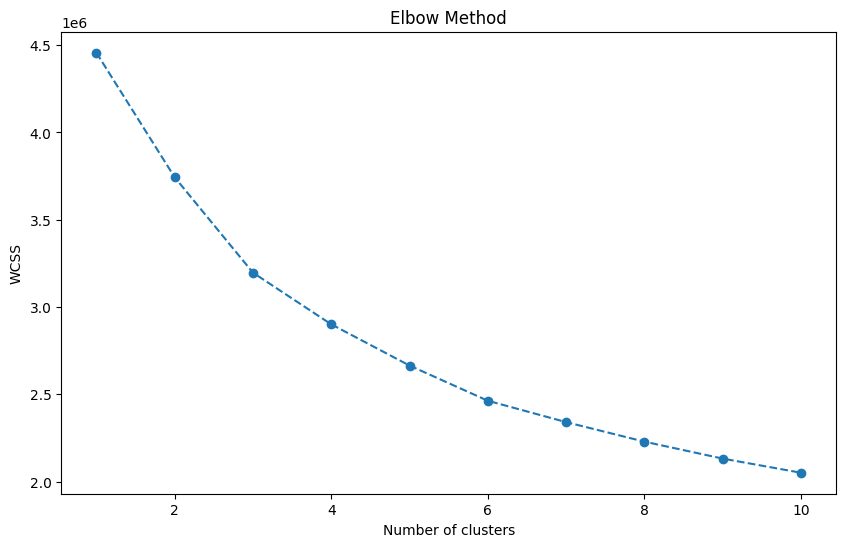

In [34]:
# implement elbow method to find optimal number of clusters
# drop trip_id and segment columns
X = scaled_data_df
# scale the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
# find optimal number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)
# plot the graph
plt.figure(figsize=(10,6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [35]:
# do a k means clustering on bus_trip_speed_and_other_features_grpd with 5 clusters
kmeans = KMeans(n_clusters=5, random_state=0).fit(scaled_data_df)
# add a column to bus_trip_speed_and_other_features_grpd with the cluster labels
bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] = kmeans.labels_
# save bus_trip_speed_and_other_features_grpd to a csv
bus_trip_speed_and_other_features_grpd.to_csv('../DataOut/bus_trip_speed_and_other_features_grpd.csv',index=False)

c:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\gw\AppData\Local\Temp\ipykernel_6648\1875310412.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] = kmeans.labels_


In [36]:
# number of clusters from each cluster lable
bus_trip_speed_and_other_features_grpd['Kmeans_cluster'].value_counts()

Kmeans_cluster
4    57800
3    51642
0    47585
1    26734
2    10016
Name: count, dtype: int64

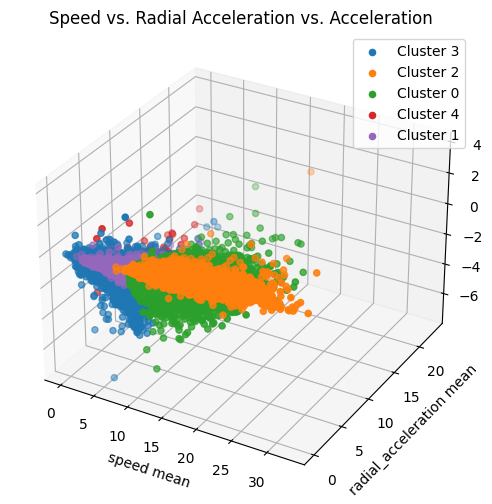

In [37]:
# visualize the clusters
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming you have a DataFrame named 'bus_trip_speed_and_other_features_grpd' that contains your data

# Create a figure and axis for the plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

x_str='speed mean'
y_str='radial_acceleration mean'
z_str='acceleration mean'

# Iterate through each cluster and plot the mean speed, mean radial acceleration, and mean acceleration
for cluster in bus_trip_speed_and_other_features_grpd['Kmeans_cluster'].unique():
    ax.scatter(bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][x_str], 
               bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][y_str], 
               bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][z_str], 
               label=f'Cluster {cluster}')

# Set labels and title
ax.set_xlabel(f'{x_str}')
ax.set_ylabel(f'{y_str}')
ax.set_zlabel(f'{z_str}')
ax.set_title('Speed vs. Radial Acceleration vs. Acceleration')

# Add a legend
ax.legend()

# Show the plot
plt.show()


In [38]:
import plotly.graph_objects as go

# Create a 3D scatter plot with reduced dot size
fig = go.Figure()

for cluster in bus_trip_speed_and_other_features_grpd['Kmeans_cluster'].unique():
    cluster_data = bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster]
    fig.add_trace(go.Scatter3d(
        x=cluster_data['speed mean'],
        y=cluster_data['radial_acceleration mean'],
        z=cluster_data['acceleration mean'],
        mode='markers',
        name=f'Cluster {cluster}',
        marker=dict(size=3),  # Adjust the size of the dots as needed
    ))

# Customize the layout
fig.update_layout(
    scene=dict(aspectmode='data'),
    title='Speed vs. Radial Acceleration vs. Acceleration'
)

# Show the interactive plot
fig.show()


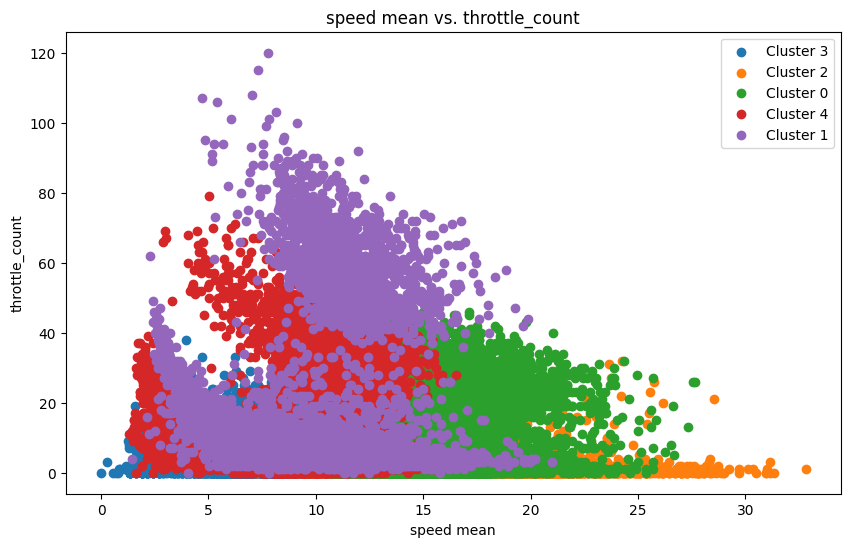

In [39]:
# plot a 2d scatter plot of the clusters
# Assuming you have a DataFrame named 'bus_trip_speed_and_other_features_grpd' that contains your data

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))

x_str='speed mean'
y_str='throttle_count'

# Iterate through each cluster and plot the mean speed and mean acceleration
for cluster in bus_trip_speed_and_other_features_grpd['Kmeans_cluster'].unique():
    ax.scatter(bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][x_str], 
               bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][y_str], 
               label=f'Cluster {cluster}')

# Set labels and title
ax.set_xlabel(x_str)
ax.set_ylabel(y_str)
ax.set_title(f"{x_str} vs. {y_str}")

# Add a legend
ax.legend()

# Show the plot
plt.show()

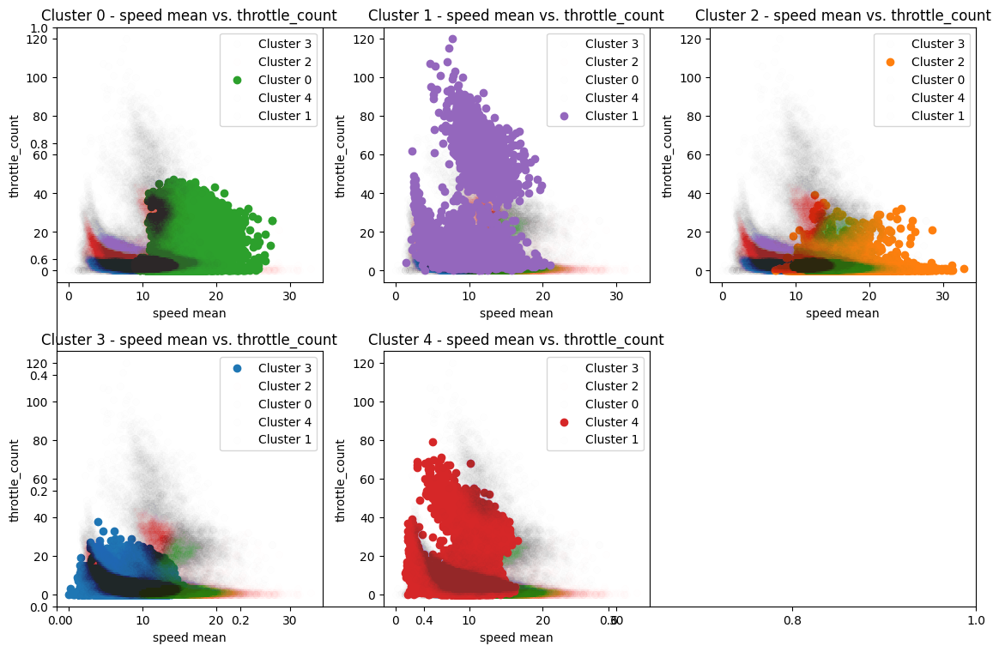

In [40]:
import matplotlib.pyplot as plt

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(12, 8))

x_str = 'speed mean'
y_str = 'throttle_count'

# Iterate through each cluster and create subplots for each cluster
for selected_cluster in bus_trip_speed_and_other_features_grpd['Kmeans_cluster'].unique():
    # Create a subplot for the selected cluster
    ax = fig.add_subplot(2, 3, selected_cluster + 1)  # Add 1 here to start indices from 1
    # Iterate through all clusters and plot the mean speed and mean acceleration
    for cluster in bus_trip_speed_and_other_features_grpd['Kmeans_cluster'].unique():
        alp = 1 if cluster == selected_cluster else 0.002
        ax.scatter(
            bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][x_str],
            bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][y_str],
            label=f'Cluster {cluster}',
            alpha=alp
        )

    # Set labels and title for the subplot
    ax.set_xlabel(x_str)
    ax.set_ylabel(y_str)
    ax.set_title(f"Cluster {selected_cluster} - {x_str} vs. {y_str}")
    ax.legend()

# Adjust the layout to prevent overlap of subplots
fig.tight_layout()

# Show the plot
plt.show()


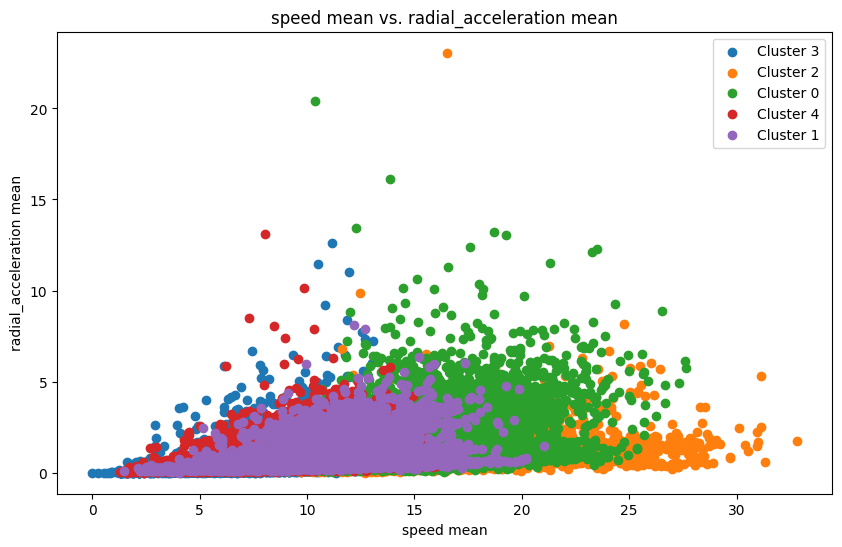

In [41]:
# plot a 2d scatter plot of the clusters
# Assuming you have a DataFrame named 'bus_trip_speed_and_other_features_grpd' that contains your data

# Create a figure and axis for the plot
fig, ax = plt.subplots(figsize=(10, 6))

x_str='speed mean'
y_str='radial_acceleration mean'

# Iterate through each cluster and plot the mean speed and mean acceleration
for cluster in bus_trip_speed_and_other_features_grpd['Kmeans_cluster'].unique():
    ax.scatter(bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][x_str], 
               bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['Kmeans_cluster'] == cluster][y_str], 
               label=f'Cluster {cluster}')

# Set labels and title
ax.set_xlabel(x_str)
ax.set_ylabel(y_str)
ax.set_title(f"{x_str} vs. {y_str}")

# Add a legend
ax.legend()

# Show the plot
plt.show()

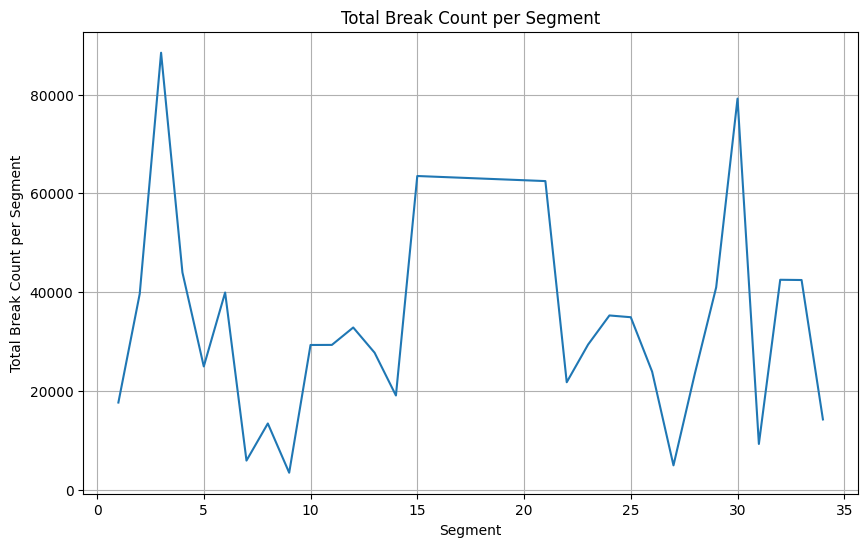

In [42]:
# plot a 2d line graph for segment vs total_break_count_per_segment
plt.figure(figsize=(10, 6))
plt.plot(bus_trip_speed_and_other_features_grpd['segment'], bus_trip_speed_and_other_features_grpd['total_break_count_per_segment'])
plt.xlabel('Segment')
plt.ylabel('Total Break Count per Segment')
plt.title('Total Break Count per Segment')
plt.grid()
plt.show()

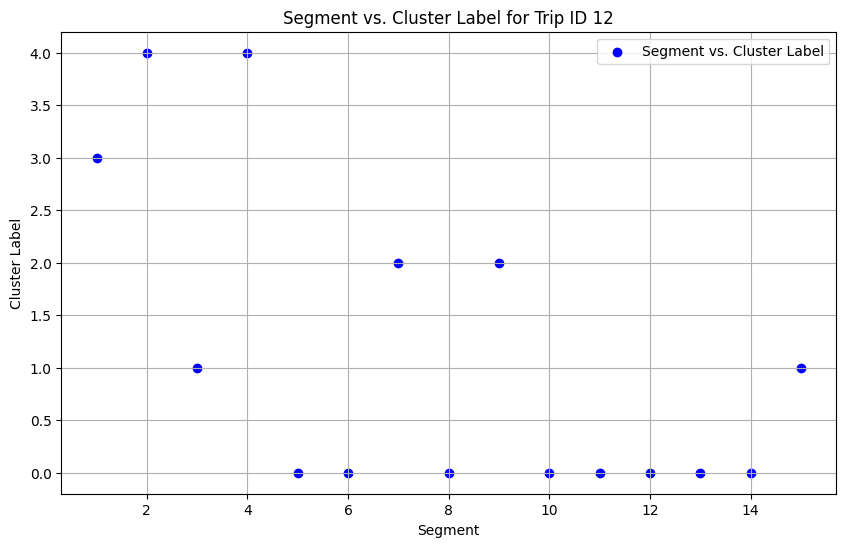

In [43]:
# for a selected trip id , draw a plot showing the segment vs cluster lable for that trip id
import matplotlib.pyplot as plt

# Select the trip ID for which you want to create the plot
selected_trip_id =12  # Replace with the actual trip ID

# Filter the data for the selected trip ID
selected_trip_data = bus_trip_speed_and_other_features_grpd[
    bus_trip_speed_and_other_features_grpd['trip_id'] == selected_trip_id
]

# Extract the segment and cluster label data
segments = selected_trip_data['segment']
cluster_labels = selected_trip_data['Kmeans_cluster']

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(segments, cluster_labels, c='b', marker='o', label='Segment vs. Cluster Label')
plt.title(f'Segment vs. Cluster Label for Trip ID {selected_trip_id}')
plt.xlabel('Segment')
plt.ylabel('Cluster Label')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()


In [44]:
bus_trip_speed_and_other_features_grpd

,segment,trip_id,deviceid,speed mean,speed std,speed min,speed max,speed median,acceleration mean,acceleration std,acceleration min,acceleration max,acceleration median,radial_acceleration mean,radial_acceleration std,radial_acceleration min,radial_acceleration max,radial_acceleration median,acceleration_der mean,acceleration_der std,acceleration_der min,acceleration_der max,acceleration_der median,throttle_count,break_count,total_break_count_per_segment,Kmeans_cluster
0,1,2.0,116.0,7.636540,4.554339,0.00000,14.03890,8.63931,-8.742162e-02,0.335023,-0.575954,0.359971,-0.179987,0.534319,0.528350,0.000000,1.278067,0.639311,-0.008571,0.027878,-0.038397,0.040797,-0.004800,1,1,17627,3
1,1,4.0,116.0,5.519560,3.558986,0.00000,9.71923,7.01944,0.000000e+00,0.339119,-0.539957,0.467963,-0.035997,0.302178,0.342921,0.000000,0.872557,0.092952,-0.001067,0.034446,-0.040797,0.057595,-0.016799,2,0,17627,3
2,1,6.0,116.0,5.399570,3.488891,0.00000,9.71923,5.93953,0.000000e+00,0.377970,-0.647949,0.431965,0.071995,0.351493,0.520755,0.000000,1.506472,0.097039,-0.001333,0.042272,-0.047996,0.059995,-0.014399,3,3,17627,3
3,1,8.0,116.0,6.599478,3.134288,0.00000,10.25920,7.01944,-5.599556e-02,0.140702,-0.287977,0.143990,0.000000,0.294084,0.337139,0.000000,0.995937,0.117268,-0.002400,0.010732,-0.016799,0.019199,-0.002400,1,0,17627,3
4,1,10.0,116.0,5.075596,3.221693,0.00000,9.71923,5.39957,-1.110223e-17,0.304028,-0.323974,0.647949,-0.053996,0.257264,0.403752,0.000000,1.040735,0.048050,-0.000240,0.031360,-0.052796,0.059995,-0.003600,1,2,17627,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193860,34,15883.0,1719.0,12.089044,2.973087,2.15983,16.19870,12.68900,-4.666414e-02,1.022163,-2.159830,2.699800,0.000000,2.045085,1.766632,0.034733,8.032701,1.575438,-0.033887,0.745066,-1.484875,2.699800,0.000000,14,16,14205,3
193861,34,15885.0,1719.0,11.509089,2.177145,7.01944,16.73870,11.87910,-6.999648e-02,0.829550,-1.619900,1.889850,0.000000,1.625022,1.512265,0.006459,6.316962,1.203558,-0.086661,1.004305,-2.969800,3.239800,-0.000001,18,18,14205,2
193862,34,15886.0,1719.0,8.490629,2.662821,3.23974,16.19870,8.63931,-4.173580e-02,0.834787,-1.619900,2.159830,0.000000,1.887558,2.069287,0.008645,11.242018,1.413202,-0.008912,0.939558,-2.429850,2.429815,0.000000,20,22,14205,3
193863,34,15888.0,1719.0,4.183115,2.408039,0.00000,10.25920,4.31966,-3.035945e-02,0.787065,-3.239740,2.159825,0.000000,1.053614,1.212462,0.000000,5.027488,0.571216,-0.033901,0.765954,-3.239740,2.564795,0.000000,28,28,14205,3


In [45]:
# read csv DataOut\bus_trip_all_points_moddedDF.csv
bus_running_times_feature_added_all_moddedDF=pd.read_csv('../DataOut/bus_running_times_feature_added_all_moddedDF.csv')

In [46]:
bus_running_times_feature_added_all_moddedDF

,trip_id,deviceid,direction,segment,date,start_time,end_time,run_time,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,conditions,dt(n-1)
0,4890.0,262.0,1.0,1.0,2021-10-01,06:39:49,06:40:58,0 days 00:01:09,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
1,4890.0,262.0,1.0,2.0,2021-10-01,06:42:12,06:45:42,0 days 00:03:30,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,74.0
2,4890.0,262.0,1.0,3.0,2021-10-01,06:45:42,06:53:58,0 days 00:08:16,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
3,4890.0,262.0,1.0,4.0,2021-10-01,06:54:04,06:57:19,0 days 00:03:15,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,6.0
4,4890.0,262.0,1.0,5.0,2021-10-01,06:57:19,06:58:56,0 days 00:01:37,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197627,3462.0,123.0,2.0,28.0,2022-10-31,18:45:44,18:47:23,0:01:39,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,9.0
197628,3462.0,123.0,2.0,29.0,2022-10-31,18:47:38,18:50:23,0:02:45,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0
197629,3462.0,123.0,2.0,30.0,2022-10-31,18:50:56,18:56:33,0:05:37,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,33.0
197630,3462.0,123.0,2.0,31.0,2022-10-31,18:56:48,18:57:34,0:00:46,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0


In [47]:
# # load '../DataOut/seg_cluster_vs_tid.csv' into a dataframe
# seg_cluster_vs_tid=pd.read_csv('../DataOut/seg_cluster_vs_tid.csv')

In [48]:
# # rename norm_cluster to Kmeans_cluster
# seg_cluster_vs_tid.rename(columns={'norm_cluster':'Kmeans_cluster'}, inplace=True)


In [49]:

# left join bus_running_times_feature_added_all_moddedDF with bus_trip_speed_and_other_features_grpd[['trip_id', 'segment', 'Kmeans_cluster'] on trip_id and segment
bus_running_times_feature_added_all_with_Kmeans_cluster = pd.merge(
    left=bus_running_times_feature_added_all_moddedDF,
    right=bus_trip_speed_and_other_features_grpd[['trip_id', 'segment', 'Kmeans_cluster']],
    on=['trip_id', 'segment'],
    how='left'
)

# # left join bus_running_times_feature_added_all_moddedDF with bus_trip_speed_and_other_features_grpd[['trip_id', 'segment', 'Kmeans_cluster'] on trip_id and segment
# bus_running_times_feature_added_all_with_Kmeans_cluster = pd.merge(
#     left=bus_running_times_feature_added_all_moddedDF,
#     right=seg_cluster_vs_tid[['trip_id', 'segment', 'Kmeans_cluster']],
#     on=['trip_id', 'segment'],
#     how='left'
# )

bus_running_times_feature_added_all_with_Kmeans_cluster


,trip_id,deviceid,direction,segment,date,start_time,end_time,run_time,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,conditions,dt(n-1),Kmeans_cluster
0,4890.0,262.0,1.0,1.0,2021-10-01,06:39:49,06:40:58,0 days 00:01:09,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0,3.0
1,4890.0,262.0,1.0,2.0,2021-10-01,06:42:12,06:45:42,0 days 00:03:30,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,74.0,4.0
2,4890.0,262.0,1.0,3.0,2021-10-01,06:45:42,06:53:58,0 days 00:08:16,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0,1.0
3,4890.0,262.0,1.0,4.0,2021-10-01,06:54:04,06:57:19,0 days 00:03:15,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,6.0,4.0
4,4890.0,262.0,1.0,5.0,2021-10-01,06:57:19,06:58:56,0 days 00:01:37,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197627,3462.0,123.0,2.0,28.0,2022-10-31,18:45:44,18:47:23,0:01:39,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,9.0,0.0
197628,3462.0,123.0,2.0,29.0,2022-10-31,18:47:38,18:50:23,0:02:45,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0,4.0
197629,3462.0,123.0,2.0,30.0,2022-10-31,18:50:56,18:56:33,0:05:37,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,33.0,1.0
197630,3462.0,123.0,2.0,31.0,2022-10-31,18:56:48,18:57:34,0:00:46,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0,0.0


In [50]:
# number of nan values in each column
bus_running_times_feature_added_all_with_Kmeans_cluster.isnull().sum()

trip_id                   0
deviceid                  0
direction                 0
segment                   0
date                      0
start_time                0
end_time                  0
run_time                  0
run_time_in_seconds       0
length                    0
day_of_week               0
time_of_day               0
Sunday/holiday            0
saturday                  0
weekday/end               0
week_no                   0
rt(w-1)                   0
rt(w-2)                   0
rt(w-3)                   0
rt(t-1)                   0
rt(t-2)                   0
rt(n-1)                   0
rt(n-2)                   0
rt(n-3)                   0
hour_of_day               0
day                       0
month                     0
temp                      0
precip                    0
windspeed                 0
conditions                0
dt(n-1)                   0
Kmeans_cluster         3855
dtype: int64

In [51]:
# bus_running_times_feature_added_all_with_Kmeans_cluster drop nan rows
bus_running_times_feature_added_all_with_Kmeans_cluster = bus_running_times_feature_added_all_with_Kmeans_cluster.dropna()
bus_running_times_feature_added_all_with_Kmeans_cluster

,trip_id,deviceid,direction,segment,date,start_time,end_time,run_time,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,conditions,dt(n-1),Kmeans_cluster
0,4890.0,262.0,1.0,1.0,2021-10-01,06:39:49,06:40:58,0 days 00:01:09,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0,3.0
1,4890.0,262.0,1.0,2.0,2021-10-01,06:42:12,06:45:42,0 days 00:03:30,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,74.0,4.0
2,4890.0,262.0,1.0,3.0,2021-10-01,06:45:42,06:53:58,0 days 00:08:16,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0,1.0
3,4890.0,262.0,1.0,4.0,2021-10-01,06:54:04,06:57:19,0 days 00:03:15,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,6.0,4.0
4,4890.0,262.0,1.0,5.0,2021-10-01,06:57:19,06:58:56,0 days 00:01:37,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197627,3462.0,123.0,2.0,28.0,2022-10-31,18:45:44,18:47:23,0:01:39,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,9.0,0.0
197628,3462.0,123.0,2.0,29.0,2022-10-31,18:47:38,18:50:23,0:02:45,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0,4.0
197629,3462.0,123.0,2.0,30.0,2022-10-31,18:50:56,18:56:33,0:05:37,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,33.0,1.0
197630,3462.0,123.0,2.0,31.0,2022-10-31,18:56:48,18:57:34,0:00:46,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0,0.0


## Train a classifier

In [52]:
def prepare(df):
    df['date'] = pd.to_datetime(df['date'])
    df['start_time'] = pd.to_datetime(df['start_time'],
                                    format='%H:%M:%S').dt.time

    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day

    df.drop(['run_time'], axis=1,inplace = True)
    df.drop(['end_time'], axis=1,inplace = True)

    #replace ' partially cloudy' with 'partially cloudy'
    df['conditions'] = df['conditions'].replace(' Partially cloudy', 'Partially cloudy')


    from sklearn.preprocessing import OrdinalEncoder

    # Replace NaN values in the 'conditions' column with 'Unknown'
    df['conditions'].fillna('Unknown', inplace=True)

    conditions = ['Rain', 'Rain, Overcast', 'Rain, Partially cloudy', 'Overcast', 'Partially cloudy', 'Clear','Unknown']
    encoder = OrdinalEncoder(categories=[conditions])
    df['conditions_encoded'] = encoder.fit_transform(df[['conditions']])

    # Now, you can drop the original 'conditions' column if needed
    df = df.drop(['conditions'], axis=1)

    df['start_float'] = df['start_time'].apply(lambda x: x.hour + x.minute/60.0 + x.second/3600.0)

    # drop 
    df = df.drop(['start_time'], axis=1)

    # Drop the original date column
    df.drop('date', axis=1, inplace=True)
    
    return df

bus_running_times_feature_added_all_with_Kmeans_cluster=prepare(bus_running_times_feature_added_all_with_Kmeans_cluster)

C:\Users\gw\AppData\Local\Temp\ipykernel_6648\2656014303.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gw\AppData\Local\Temp\ipykernel_6648\2656014303.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gw\AppData\Local\Temp\ipykernel_6648\2656014303.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

In [53]:
bus_running_times_feature_added_all_with_Kmeans_cluster

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),Kmeans_cluster,year,conditions_encoded,start_float
0,4890.0,262.0,1.0,1.0,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1,10,20.0,0.0,6.1,0.0,3.0,2021,4.0,6.663611
1,4890.0,262.0,1.0,2.0,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1,10,20.0,0.0,6.1,74.0,4.0,2021,4.0,6.703333
2,4890.0,262.0,1.0,3.0,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1,10,20.0,0.0,6.1,0.0,1.0,2021,4.0,6.761667
3,4890.0,262.0,1.0,4.0,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1,10,20.0,0.0,6.1,6.0,4.0,2021,4.0,6.901111
4,4890.0,262.0,1.0,5.0,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1,10,20.0,0.0,6.1,0.0,0.0,2021,4.0,6.955278
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197627,3462.0,123.0,2.0,28.0,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31,10,22.2,0.0,4.3,9.0,0.0,2022,4.0,18.762222
197628,3462.0,123.0,2.0,29.0,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31,10,22.2,0.0,4.3,15.0,4.0,2022,4.0,18.793889
197629,3462.0,123.0,2.0,30.0,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31,10,22.2,0.0,4.3,33.0,1.0,2022,4.0,18.848889
197630,3462.0,123.0,2.0,31.0,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31,10,22.2,0.0,4.3,15.0,0.0,2022,4.0,18.946667


In [54]:
# print nan values in every column
bus_running_times_feature_added_all_with_Kmeans_cluster.isnull().sum()

trip_id                0
deviceid               0
direction              0
segment                0
run_time_in_seconds    0
length                 0
day_of_week            0
time_of_day            0
Sunday/holiday         0
saturday               0
weekday/end            0
week_no                0
rt(w-1)                0
rt(w-2)                0
rt(w-3)                0
rt(t-1)                0
rt(t-2)                0
rt(n-1)                0
rt(n-2)                0
rt(n-3)                0
hour_of_day            0
day                    0
month                  0
temp                   0
precip                 0
windspeed              0
dt(n-1)                0
Kmeans_cluster         0
year                   0
conditions_encoded     0
start_float            0
dtype: int64

In [55]:
# open csv avg_for_devID_time_of_day_and_segment.csv
avg_for_devID_time_of_day_and_segment = pd.read_csv('../DataOut/avg_for_devID_time_of_day_and_segment.csv')
# rename avg_for_devID_time_of_day_and_segment time_of_day column to dayparts
avg_for_devID_time_of_day_and_segment.rename(columns={'time_of_day': 'dayparts'}, inplace=True)
avg_for_devID_time_of_day_and_segment

,deviceid,dayparts,segment,speed,acceleration,radial_acceleration,throttle_count,break_count
0,116.0,morning,0,3.914116,-0.017456,0.265196,4.388889,2.555556
1,116.0,morning,1,6.617755,-0.022759,0.354919,1.444820,1.453245
2,116.0,morning,2,8.190476,0.021226,0.536539,3.344290,1.696848
3,116.0,morning,3,9.379045,-0.009781,0.627968,7.637994,6.356376
4,116.0,morning,4,13.073141,-0.028369,0.431310,4.018528,3.886830
...,...,...,...,...,...,...,...,...
2335,1719.0,night,30,12.734617,-0.056198,2.164006,67.990000,71.200000
2336,1719.0,night,31,9.778024,-0.116117,1.839681,15.607843,15.161765
2337,1719.0,night,32,10.840697,-0.041236,2.566036,36.789216,36.313725
2338,1719.0,night,33,10.507523,-0.030423,2.999890,41.034314,41.774510


In [56]:
# Create a new 'time_of_day' column based on the time component
bus_running_times_feature_added_all_with_Kmeans_cluster['dayparts'] = pd.cut(
    bus_running_times_feature_added_all_with_Kmeans_cluster['hour_of_day'],
    bins=[0, 6, 19, 24],
    labels=['morning', 'day', 'night'],
    include_lowest=True
)

In [57]:
# add data from avg_for_devID_time_of_day_and_segment to daf_with_features based on deviceid and dayparts
bus_running_times_feature_added_all_with_Kmeans_cluster = pd.merge(bus_running_times_feature_added_all_with_Kmeans_cluster, avg_for_devID_time_of_day_and_segment, on=['deviceid', 'dayparts','segment'], how='left')

In [58]:
# Create a custom mapping dictionary
dayparts_mapping = {'morning': 0, 'day': 1, 'night': 2}

# Use the map function to label encode 'dayparts' column
bus_running_times_feature_added_all_with_Kmeans_cluster['dayparts'] = bus_running_times_feature_added_all_with_Kmeans_cluster['dayparts'].map(dayparts_mapping)

In [59]:
bus_running_times_feature_added_all_with_Kmeans_cluster

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),Kmeans_cluster,year,conditions_encoded,start_float,dayparts,speed,acceleration,radial_acceleration,throttle_count,break_count
0,4890.0,262.0,1.0,1.0,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1,10,20.0,0.0,6.1,0.0,3.0,2021,4.0,6.663611,0,6.551622,-0.263065,0.289582,1.333333,0.333333
1,4890.0,262.0,1.0,2.0,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1,10,20.0,0.0,6.1,74.0,4.0,2021,4.0,6.703333,0,10.318498,-0.020071,0.876211,3.000000,1.000000
2,4890.0,262.0,1.0,3.0,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1,10,20.0,0.0,6.1,0.0,1.0,2021,4.0,6.761667,0,9.510959,-0.306166,0.668537,7.500000,8.250000
3,4890.0,262.0,1.0,4.0,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1,10,20.0,0.0,6.1,6.0,4.0,2021,4.0,6.901111,0,12.014774,-0.072601,0.425698,3.250000,3.750000
4,4890.0,262.0,1.0,5.0,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1,10,20.0,0.0,6.1,0.0,0.0,2021,4.0,6.955278,0,14.626720,-0.645813,0.374014,1.250000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193772,3462.0,123.0,2.0,28.0,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31,10,22.2,0.0,4.3,9.0,0.0,2022,4.0,18.762222,1,9.194479,-0.351201,0.519947,2.371622,2.594595
193773,3462.0,123.0,2.0,29.0,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31,10,22.2,0.0,4.3,15.0,4.0,2022,4.0,18.793889,1,10.303061,-0.349294,0.602160,4.045558,4.482916
193774,3462.0,123.0,2.0,30.0,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31,10,22.2,0.0,4.3,33.0,1.0,2022,4.0,18.848889,1,9.094664,-0.193578,0.292496,9.096998,9.775982
193775,3462.0,123.0,2.0,31.0,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31,10,22.2,0.0,4.3,15.0,0.0,2022,4.0,18.946667,1,9.831210,-0.159683,0.266565,0.619048,1.043084


In [60]:
# in bus_running_times_feature_added_all_with_Kmeans_clusterfor create a new column cll "cluster_in_segment_before" that cntain the cluster of the previous segment of the same trip_id
bus_running_times_feature_added_all_with_Kmeans_cluster['cluster_in_1_segment_before'] = bus_running_times_feature_added_all_with_Kmeans_cluster.groupby(['trip_id'])['Kmeans_cluster'].shift(1)
bus_running_times_feature_added_all_with_Kmeans_cluster['cluster_in_2_segment_before'] = bus_running_times_feature_added_all_with_Kmeans_cluster.groupby(['trip_id'])['Kmeans_cluster'].shift(2)
bus_running_times_feature_added_all_with_Kmeans_cluster['cluster_in_3_segment_before'] = bus_running_times_feature_added_all_with_Kmeans_cluster.groupby(['trip_id'])['Kmeans_cluster'].shift(3)

In [61]:
# Define the split date
split_date= "2022-10-01"

# create a temperary date column using year, month, day column to use for splitting for test and tran datasets
bus_running_times_feature_added_all_with_Kmeans_cluster['temp_date'] = bus_running_times_feature_added_all_with_Kmeans_cluster['year'].astype(str) + '-' + bus_running_times_feature_added_all_with_Kmeans_cluster['month'].astype(str) + '-' + bus_running_times_feature_added_all_with_Kmeans_cluster['day'].astype(str)
# convert temp_date to datetime
bus_running_times_feature_added_all_with_Kmeans_cluster['temp_date'] = pd.to_datetime(bus_running_times_feature_added_all_with_Kmeans_cluster['temp_date'])
# convert split_date to datetime
split_date = pd.to_datetime(split_date)

# split test and train datasets
train_data = bus_running_times_feature_added_all_with_Kmeans_cluster[bus_running_times_feature_added_all_with_Kmeans_cluster['temp_date'] < split_date]
test_data = bus_running_times_feature_added_all_with_Kmeans_cluster[bus_running_times_feature_added_all_with_Kmeans_cluster['temp_date'] >= split_date]

# randomly remowe 7000 rows from train_data where Kmeans_cluster is 2.0
# train_data = train_data.drop(train_data[(train_data['Kmeans_cluster'] == 2.0)].sample(n=80000).index)

# drop temp_date column
train_data = train_data.drop(columns=['temp_date'])
test_data = test_data.drop(columns=['temp_date'])
bus_running_times_feature_added_all_with_Kmeans_cluster=bus_running_times_feature_added_all_with_Kmeans_cluster.drop(columns=['temp_date'])

# Separate features and labels
X_train = train_data.drop(columns=['Kmeans_cluster', 'trip_id','run_time_in_seconds'])
y_train = train_data['Kmeans_cluster']
X_test = test_data.drop(columns=['Kmeans_cluster', 'trip_id','run_time_in_seconds'])
y_test = test_data['Kmeans_cluster']

In [62]:

# check the number of each cluster lables in train_data
train_data['Kmeans_cluster'].value_counts()


Kmeans_cluster
4.0    51356
3.0    45376
0.0    39984
1.0    23322
2.0     8969
Name: count, dtype: int64

In [63]:
bus_running_times_feature_added_all_with_Kmeans_cluster

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),Kmeans_cluster,year,conditions_encoded,start_float,dayparts,speed,acceleration,radial_acceleration,throttle_count,break_count,cluster_in_1_segment_before,cluster_in_2_segment_before,cluster_in_3_segment_before
0,4890.0,262.0,1.0,1.0,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1,10,20.0,0.0,6.1,0.0,3.0,2021,4.0,6.663611,0,6.551622,-0.263065,0.289582,1.333333,0.333333,NaN,NaN,NaN
1,4890.0,262.0,1.0,2.0,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1,10,20.0,0.0,6.1,74.0,4.0,2021,4.0,6.703333,0,10.318498,-0.020071,0.876211,3.000000,1.000000,3.0,NaN,NaN
2,4890.0,262.0,1.0,3.0,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1,10,20.0,0.0,6.1,0.0,1.0,2021,4.0,6.761667,0,9.510959,-0.306166,0.668537,7.500000,8.250000,4.0,3.0,NaN
3,4890.0,262.0,1.0,4.0,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1,10,20.0,0.0,6.1,6.0,4.0,2021,4.0,6.901111,0,12.014774,-0.072601,0.425698,3.250000,3.750000,1.0,4.0,3.0
4,4890.0,262.0,1.0,5.0,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1,10,20.0,0.0,6.1,0.0,0.0,2021,4.0,6.955278,0,14.626720,-0.645813,0.374014,1.250000,1.000000,4.0,1.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193772,3462.0,123.0,2.0,28.0,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31,10,22.2,0.0,4.3,9.0,0.0,2022,4.0,18.762222,1,9.194479,-0.351201,0.519947,2.371622,2.594595,3.0,0.0,4.0
193773,3462.0,123.0,2.0,29.0,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31,10,22.2,0.0,4.3,15.0,4.0,2022,4.0,18.793889,1,10.303061,-0.349294,0.602160,4.045558,4.482916,0.0,3.0,0.0
193774,3462.0,123.0,2.0,30.0,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31,10,22.2,0.0,4.3,33.0,1.0,2022,4.0,18.848889,1,9.094664,-0.193578,0.292496,9.096998,9.775982,4.0,0.0,3.0
193775,3462.0,123.0,2.0,31.0,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31,10,22.2,0.0,4.3,15.0,0.0,2022,4.0,18.946667,1,9.831210,-0.159683,0.266565,0.619048,1.043084,1.0,4.0,0.0


In [64]:
# print the sizes of test and train data
print(f"Train data size: {X_train.shape}")
print(f"Test data size: {X_test.shape}")

# get the sum of row count of train and test data
print(f"Total data size: {X_train.shape[0] + X_test.shape[0]}")
# print the original size of bus_running_times_feature_added_all_with_Kmeans_cluster 
print(f"Original data size: {bus_running_times_feature_added_all_with_Kmeans_cluster.shape}")

Train data size: (169007, 37)
Test data size: (24770, 37)
Total data size: 193777
Original data size: (193777, 40)


In [65]:
# import pandas as pd
# from sklearn.model_selection import train_test_split, GridSearchCV
# from xgboost import XGBClassifier
# from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, roc_auc_score
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import make_scorer

# # Define the evaluation metrics you want to use
# # Define the evaluation metrics you want to use
# scoring = {
#     'accuracy': make_scorer(accuracy_score),
#     'precision': make_scorer(precision_score, average='weighted'),
#     'recall': make_scorer(recall_score, average='weighted'),
#     'f1': make_scorer(f1_score, average='weighted'),
#     'roc_auc': 'roc_auc_ovr'  # For multi-class classification
# }


# # Create the XGBoost model with GPU support
# xgb = XGBClassifier(
#     tree_method='gpu_hist',  # Enable GPU support
#     gpu_id=0,  # Specify the GPU device (0 is the default)
#     objective='multi:softprob',  # Specify multi-class classification
#     num_class=4  # Number of unique classes in your data
# )

# # Define a grid of hyperparameters to search
# param_grid = {
#     'n_estimators': [100, 200, 300],  # You can extend the range
#     'learning_rate': [0.01, 0.2, 0.3],  # You can extend the range
#     'max_depth': [3, 5, 6],  # You can extend the range
#     'min_child_weight': [1, 2, 3]  # You can extend the range
# }


# # Create the GridSearchCV object with multiple evaluation metrics
# grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring=scoring, refit='f1', cv=3)

# # Train and evaluate the model with the specified metrics
# grid_search.fit(X_train, y_train)

# # Get the best parameters and the best estimator
# best_params = grid_search.best_params_
# best_xgb = grid_search.best_estimator_

# # Evaluate the best model on the test data using different metrics
# y_pred = best_xgb.predict(X_test)

# accuracy = accuracy_score(y_test, y_pred)
# precision = precision_score(y_test, y_pred, average='weighted')
# recall = recall_score(y_test, y_pred, average='weighted')
# f1 = f1_score(y_test, y_pred, average='weighted')
# roc_auc = roc_auc_score(y_test, best_xgb.predict_proba(X_test), average='weighted', multi_class='ovr')

# print("Best Hyperparameters:", best_params)
# print("Accuracy:", accuracy)
# print("Precision:", precision)
# print("Recall:", recall)
# print("F1 Score:", f1)
# print("ROC AUC:", roc_auc)


In [66]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier


# Step 3: Train the XGBoost Model
xgb = XGBClassifier()

# Then, train your model and evaluate it as you did in your previous code.

xgb.fit(X_train, y_train)

# Step 4: Evaluate the Model
y_pred = xgb.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", report)

# Step 5 : Save the Model
# export best xgboost model
import pickle
pickle.dump(xgb, open('../ModelOut/Segemnt_Cluster_Classifier.sav', 'wb'))


# Step 6: Predict on Test Data
predicted_labels = xgb.predict(X_test)

# Step 7: Create a New DataFrame for Test Data with Predicted Values
test_data['Predicted_Kmeans_cluster'] = predicted_labels


Accuracy: 0.7698829228905935
Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.59      0.65      7601
         1.0       1.00      1.00      1.00      3412
         2.0       0.46      0.12      0.19      1047
         3.0       0.75      0.88      0.81      6266
         4.0       0.74      0.86      0.79      6444

    accuracy                           0.77     24770
   macro avg       0.73      0.69      0.69     24770
weighted avg       0.76      0.77      0.76     24770



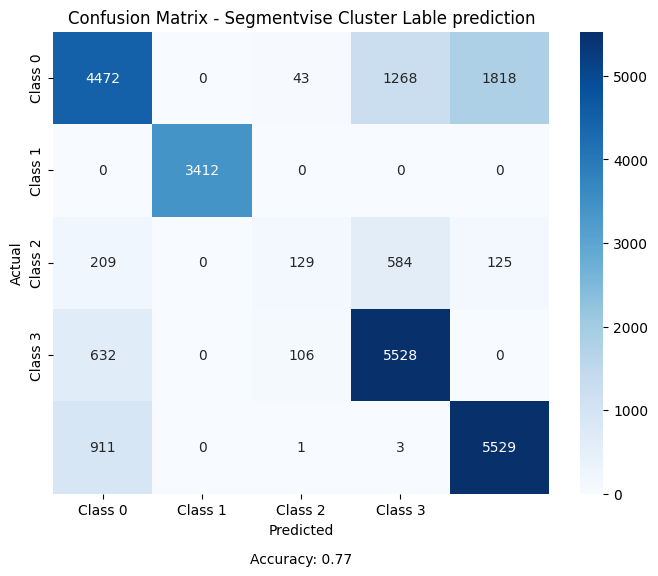

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_test contains actual labels and y_pred contains predicted labels
confusion = confusion_matrix(y_test, y_pred)

# Create a heatmap to visualize the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2','Class 3'], yticklabels=['Class 0', 'Class 1', 'Class 2','Class 3'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Segmentvise Cluster Lable prediction')

# Annotate the accuracy value at the bottom of the graph
plt.annotate(f'Accuracy: {accuracy:.2f}', (0.5, -0.15), xycoords='axes fraction', ha='center')

plt.show()


In [68]:
# import pandas as pd
# from sklearn.model_selection import train_test_split
# from xgboost import XGBClassifier
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.linear_model import LogisticRegression
# from sklearn.svm import SVC
# from sklearn.neighbors import KNeighborsClassifier
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.metrics import accuracy_score, classification_report

# # Step 3: Train the XGBoost Model
# xgb = XGBClassifier()
# xgb.fit(X_train, y_train)

# # Step 4: Evaluate the XGBoost Model
# y_pred_xgb = xgb.predict(X_test)
# accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
# report_xgb = classification_report(y_test, y_pred_xgb)

# print("XGBoost Accuracy:", accuracy_xgb)
# print("XGBoost Classification Report:\n", report_xgb)


# X_train = X_train.dropna()
# y_train = y_train.loc[X_train.index]  # Match labels to the remaining samples

# X_test = X_test.dropna()
# y_test = y_test.loc[X_test.index]  # Match labels to the remaining samples

# # Step 5: Train a Random Forest Model
# rf = RandomForestClassifier()
# rf.fit(X_train, y_train)

# # Step 6: Evaluate the Random Forest Model
# y_pred_rf = rf.predict(X_test)
# accuracy_rf = accuracy_score(y_test, y_pred_rf)
# report_rf = classification_report(y_test, y_pred_rf)

# print("Random Forest Accuracy:", accuracy_rf)
# print("Random Forest Classification Report:\n", report_rf)

# # Step 7: Train a Logistic Regression Model
# lr = LogisticRegression(max_iter=1000)  # Increase max_iter
# lr.fit(X_train, y_train)

# # Step 8: Evaluate the Logistic Regression Model
# y_pred_lr = lr.predict(X_test)
# accuracy_lr = accuracy_score(y_test, y_pred_lr)
# report_lr = classification_report(y_test, y_pred_lr)

# print("Logistic Regression Accuracy:", accuracy_lr)
# print("Logistic Regression Classification Report:\n", report_lr)

# # # Step 9: Train a Support Vector Machine (SVM) Model
# # svm = SVC()
# # svm.fit(X_train, y_train)

# # # Step 10: Evaluate the SVM Model
# # y_pred_svm = svm.predict(X_test)
# # accuracy_svm = accuracy_score(y_test, y_pred_svm)
# # report_svm = classification_report(y_test, y_pred_svm)

# # print("SVM Accuracy:", accuracy_svm)
# # print("SVM Classification Report:\n", report_svm)

# # Step 11: Train a K-Nearest Neighbors (KNN) Model
# knn = KNeighborsClassifier()
# knn.fit(X_train, y_train)

# # Step 12: Evaluate the KNN Model
# y_pred_knn = knn.predict(X_test)
# accuracy_knn = accuracy_score(y_test, y_pred_knn)
# report_knn = classification_report(y_test, y_pred_knn)

# print("K-Nearest Neighbors Accuracy:", accuracy_knn)
# print("K-Nearest Neighbors Classification Report:\n", report_knn)

# # Step 13: Train a Decision Tree Model
# dt = DecisionTreeClassifier()
# dt.fit(X_train, y_train)

# # Step 14: Evaluate the Decision Tree Model
# y_pred_dt = dt.predict(X_test)
# accuracy_dt = accuracy_score(y_test, y_pred_dt)
# report_dt = classification_report(y_test, y_pred_dt)

# print("Decision Tree Accuracy:", accuracy_dt)
# print("Decision Tree Classification Report:\n", report_dt)


In [69]:
test_data

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),Kmeans_cluster,year,conditions_encoded,start_float,dayparts,speed,acceleration,radial_acceleration,throttle_count,break_count,cluster_in_1_segment_before,cluster_in_2_segment_before,cluster_in_3_segment_before,Predicted_Kmeans_cluster
153320,12471.0,1166.0,1.0,1.0,165.0,0.63,6.0,6.50,1.0,0,0,37.0,113.0,106.0,102.0,113.0,113.0,113.0,113.0,113.0,6.0,2,10,19.1,0.0,10.4,0.0,3.0,2022,3.0,6.693611,0,5.411070,-0.033928,0.242931,1.924051,1.265823,NaN,NaN,NaN,3
153321,12471.0,1166.0,1.0,2.0,238.0,1.28,6.0,6.75,1.0,0,0,37.0,276.0,373.0,276.0,276.0,276.0,165.0,276.0,276.0,6.0,2,10,19.1,0.0,10.4,210.0,4.0,2022,3.0,6.797778,0,7.888261,0.010213,0.588317,3.924051,2.329114,3.0,NaN,NaN,4
153322,12471.0,1166.0,1.0,3.0,502.0,2.11,6.0,6.75,1.0,0,0,37.0,546.0,476.0,578.0,546.0,546.0,238.0,165.0,546.0,6.0,2,10,19.1,0.0,10.4,0.0,1.0,2022,3.0,6.863889,0,7.562210,0.004496,0.452482,9.506329,7.645570,4.0,3.0,NaN,1
153323,12471.0,1166.0,1.0,4.0,163.0,1.55,6.0,7.00,1.0,0,0,37.0,204.0,223.0,204.0,204.0,204.0,502.0,238.0,165.0,7.0,2,10,19.5,0.0,10.4,15.0,0.0,2022,3.0,7.007500,1,11.317746,0.015140,0.345586,4.468354,4.379747,1.0,4.0,3.0,4
153324,12471.0,1166.0,1.0,5.0,105.0,0.84,6.0,7.00,1.0,0,0,37.0,123.0,135.0,123.0,123.0,123.0,163.0,502.0,238.0,7.0,2,10,19.5,0.0,10.4,0.0,0.0,2022,3.0,7.052778,1,10.665996,-0.149465,0.294643,2.291139,2.670886,0.0,1.0,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193772,3462.0,123.0,2.0,28.0,99.0,0.87,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31,10,22.2,0.0,4.3,9.0,0.0,2022,4.0,18.762222,1,9.194479,-0.351201,0.519947,2.371622,2.594595,3.0,0.0,4.0,3
193773,3462.0,123.0,2.0,29.0,165.0,1.40,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31,10,22.2,0.0,4.3,15.0,4.0,2022,4.0,18.793889,1,10.303061,-0.349294,0.602160,4.045558,4.482916,0.0,3.0,0.0,4
193774,3462.0,123.0,2.0,30.0,337.0,2.56,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31,10,22.2,0.0,4.3,33.0,1.0,2022,4.0,18.848889,1,9.094664,-0.193578,0.292496,9.096998,9.775982,4.0,0.0,3.0,1
193775,3462.0,123.0,2.0,31.0,46.0,0.42,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31,10,22.2,0.0,4.3,15.0,0.0,2022,4.0,18.946667,1,9.831210,-0.159683,0.266565,0.619048,1.043084,1.0,4.0,0.0,3


In [70]:
# from test_ data drop the Kmeans_cluster column and rename the Predicted_Kmeans_cluster column to Kmeans_cluster
test_data.drop('Kmeans_cluster',axis=1,inplace=True)
test_data.rename(columns={'Predicted_Kmeans_cluster':'Kmeans_cluster'},inplace=True)

In [71]:
test_data

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),year,conditions_encoded,start_float,dayparts,speed,acceleration,radial_acceleration,throttle_count,break_count,cluster_in_1_segment_before,cluster_in_2_segment_before,cluster_in_3_segment_before,Kmeans_cluster
153320,12471.0,1166.0,1.0,1.0,165.0,0.63,6.0,6.50,1.0,0,0,37.0,113.0,106.0,102.0,113.0,113.0,113.0,113.0,113.0,6.0,2,10,19.1,0.0,10.4,0.0,2022,3.0,6.693611,0,5.411070,-0.033928,0.242931,1.924051,1.265823,NaN,NaN,NaN,3
153321,12471.0,1166.0,1.0,2.0,238.0,1.28,6.0,6.75,1.0,0,0,37.0,276.0,373.0,276.0,276.0,276.0,165.0,276.0,276.0,6.0,2,10,19.1,0.0,10.4,210.0,2022,3.0,6.797778,0,7.888261,0.010213,0.588317,3.924051,2.329114,3.0,NaN,NaN,4
153322,12471.0,1166.0,1.0,3.0,502.0,2.11,6.0,6.75,1.0,0,0,37.0,546.0,476.0,578.0,546.0,546.0,238.0,165.0,546.0,6.0,2,10,19.1,0.0,10.4,0.0,2022,3.0,6.863889,0,7.562210,0.004496,0.452482,9.506329,7.645570,4.0,3.0,NaN,1
153323,12471.0,1166.0,1.0,4.0,163.0,1.55,6.0,7.00,1.0,0,0,37.0,204.0,223.0,204.0,204.0,204.0,502.0,238.0,165.0,7.0,2,10,19.5,0.0,10.4,15.0,2022,3.0,7.007500,1,11.317746,0.015140,0.345586,4.468354,4.379747,1.0,4.0,3.0,4
153324,12471.0,1166.0,1.0,5.0,105.0,0.84,6.0,7.00,1.0,0,0,37.0,123.0,135.0,123.0,123.0,123.0,163.0,502.0,238.0,7.0,2,10,19.5,0.0,10.4,0.0,2022,3.0,7.052778,1,10.665996,-0.149465,0.294643,2.291139,2.670886,0.0,1.0,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193772,3462.0,123.0,2.0,28.0,99.0,0.87,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31,10,22.2,0.0,4.3,9.0,2022,4.0,18.762222,1,9.194479,-0.351201,0.519947,2.371622,2.594595,3.0,0.0,4.0,3
193773,3462.0,123.0,2.0,29.0,165.0,1.40,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31,10,22.2,0.0,4.3,15.0,2022,4.0,18.793889,1,10.303061,-0.349294,0.602160,4.045558,4.482916,0.0,3.0,0.0,4
193774,3462.0,123.0,2.0,30.0,337.0,2.56,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31,10,22.2,0.0,4.3,33.0,2022,4.0,18.848889,1,9.094664,-0.193578,0.292496,9.096998,9.775982,4.0,0.0,3.0,1
193775,3462.0,123.0,2.0,31.0,46.0,0.42,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31,10,22.2,0.0,4.3,15.0,2022,4.0,18.946667,1,9.831210,-0.159683,0.266565,0.619048,1.043084,1.0,4.0,0.0,3


In [72]:
train_data

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),Kmeans_cluster,year,conditions_encoded,start_float,dayparts,speed,acceleration,radial_acceleration,throttle_count,break_count,cluster_in_1_segment_before,cluster_in_2_segment_before,cluster_in_3_segment_before
0,4890.0,262.0,1.0,1.0,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1,10,20.0,0.0,6.1,0.0,3.0,2021,4.0,6.663611,0,6.551622,-0.263065,0.289582,1.333333,0.333333,NaN,NaN,NaN
1,4890.0,262.0,1.0,2.0,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1,10,20.0,0.0,6.1,74.0,4.0,2021,4.0,6.703333,0,10.318498,-0.020071,0.876211,3.000000,1.000000,3.0,NaN,NaN
2,4890.0,262.0,1.0,3.0,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1,10,20.0,0.0,6.1,0.0,1.0,2021,4.0,6.761667,0,9.510959,-0.306166,0.668537,7.500000,8.250000,4.0,3.0,NaN
3,4890.0,262.0,1.0,4.0,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1,10,20.0,0.0,6.1,6.0,4.0,2021,4.0,6.901111,0,12.014774,-0.072601,0.425698,3.250000,3.750000,1.0,4.0,3.0
4,4890.0,262.0,1.0,5.0,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1,10,20.0,0.0,6.1,0.0,0.0,2021,4.0,6.955278,0,14.626720,-0.645813,0.374014,1.250000,1.000000,4.0,1.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181758,6452.0,264.0,2.0,30.0,523.0,2.5600,4.0,18.25,0.0,0,1,37.0,422.0,422.0,487.0,422.0,329.0,283.0,181.0,54.0,18.0,30,9,23.0,0.0,11.2,15.0,1.0,2022,4.0,18.380833,1,10.124044,-0.112855,0.267673,5.602459,5.135246,4.0,3.0,3.0
181759,6452.0,264.0,2.0,31.0,57.0,0.4200,4.0,18.50,0.0,0,1,37.0,68.0,59.0,53.0,54.0,68.0,523.0,283.0,181.0,18.0,30,9,23.0,0.0,11.2,15.0,2.0,2022,4.0,18.530278,1,9.430034,-0.092744,0.253931,0.330544,0.523013,1.0,4.0,3.0
181760,6452.0,264.0,2.0,32.0,257.0,1.3000,4.0,18.50,0.0,0,1,37.0,178.0,281.0,221.0,200.0,192.0,57.0,523.0,283.0,18.0,30,9,23.0,0.0,11.2,0.0,4.0,2022,4.0,18.546111,1,9.100006,-0.134903,0.572255,2.840637,2.509960,2.0,1.0,4.0
181761,6452.0,264.0,2.0,33.0,203.0,1.2200,4.0,18.50,0.0,0,1,37.0,165.0,184.0,164.0,177.0,179.0,257.0,57.0,523.0,18.0,30,9,23.0,0.0,11.2,15.0,4.0,2022,4.0,18.621667,1,8.769900,-0.013951,0.601572,3.265487,2.734513,4.0,2.0,1.0


In [73]:
# concatanate train_data and test_data
bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test = pd.concat([train_data,test_data])
bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),Kmeans_cluster,year,conditions_encoded,start_float,dayparts,speed,acceleration,radial_acceleration,throttle_count,break_count,cluster_in_1_segment_before,cluster_in_2_segment_before,cluster_in_3_segment_before
0,4890.0,262.0,1.0,1.0,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1,10,20.0,0.0,6.1,0.0,3.0,2021,4.0,6.663611,0,6.551622,-0.263065,0.289582,1.333333,0.333333,NaN,NaN,NaN
1,4890.0,262.0,1.0,2.0,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1,10,20.0,0.0,6.1,74.0,4.0,2021,4.0,6.703333,0,10.318498,-0.020071,0.876211,3.000000,1.000000,3.0,NaN,NaN
2,4890.0,262.0,1.0,3.0,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1,10,20.0,0.0,6.1,0.0,1.0,2021,4.0,6.761667,0,9.510959,-0.306166,0.668537,7.500000,8.250000,4.0,3.0,NaN
3,4890.0,262.0,1.0,4.0,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1,10,20.0,0.0,6.1,6.0,4.0,2021,4.0,6.901111,0,12.014774,-0.072601,0.425698,3.250000,3.750000,1.0,4.0,3.0
4,4890.0,262.0,1.0,5.0,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1,10,20.0,0.0,6.1,0.0,0.0,2021,4.0,6.955278,0,14.626720,-0.645813,0.374014,1.250000,1.000000,4.0,1.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193772,3462.0,123.0,2.0,28.0,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31,10,22.2,0.0,4.3,9.0,3.0,2022,4.0,18.762222,1,9.194479,-0.351201,0.519947,2.371622,2.594595,3.0,0.0,4.0
193773,3462.0,123.0,2.0,29.0,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31,10,22.2,0.0,4.3,15.0,4.0,2022,4.0,18.793889,1,10.303061,-0.349294,0.602160,4.045558,4.482916,0.0,3.0,0.0
193774,3462.0,123.0,2.0,30.0,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31,10,22.2,0.0,4.3,33.0,1.0,2022,4.0,18.848889,1,9.094664,-0.193578,0.292496,9.096998,9.775982,4.0,0.0,3.0
193775,3462.0,123.0,2.0,31.0,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31,10,22.2,0.0,4.3,15.0,3.0,2022,4.0,18.946667,1,9.831210,-0.159683,0.266565,0.619048,1.043084,1.0,4.0,0.0


In [74]:
bus_running_times_feature_added_all_moddedDF

,trip_id,deviceid,direction,segment,date,start_time,end_time,run_time,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,conditions,dt(n-1)
0,4890.0,262.0,1.0,1.0,2021-10-01,06:39:49,06:40:58,0 days 00:01:09,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
1,4890.0,262.0,1.0,2.0,2021-10-01,06:42:12,06:45:42,0 days 00:03:30,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,74.0
2,4890.0,262.0,1.0,3.0,2021-10-01,06:45:42,06:53:58,0 days 00:08:16,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
3,4890.0,262.0,1.0,4.0,2021-10-01,06:54:04,06:57:19,0 days 00:03:15,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,6.0
4,4890.0,262.0,1.0,5.0,2021-10-01,06:57:19,06:58:56,0 days 00:01:37,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1.0,10.0,20.0,0.0,6.1,Partially cloudy,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197627,3462.0,123.0,2.0,28.0,2022-10-31,18:45:44,18:47:23,0:01:39,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,9.0
197628,3462.0,123.0,2.0,29.0,2022-10-31,18:47:38,18:50:23,0:02:45,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0
197629,3462.0,123.0,2.0,30.0,2022-10-31,18:50:56,18:56:33,0:05:37,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,33.0
197630,3462.0,123.0,2.0,31.0,2022-10-31,18:56:48,18:57:34,0:00:46,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31.0,10.0,22.2,0.0,4.3,Partially cloudy,15.0


In [75]:
# # left join bus_running_times_feature_added_all_moddedDF with bus_trip_speed_and_other_features_grpd[['trip_id', 'segment', 'Kmeans_cluster'] on trip_id and segment
# bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test = pd.merge(
#     left=bus_running_times_feature_added_all_moddedDF,
#     right=bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test[['trip_id', 'segment', 'Kmeans_cluster']],
#     on=['trip_id', 'segment'],
#     how='left'
# )

In [76]:
bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test

,trip_id,deviceid,direction,segment,run_time_in_seconds,length,day_of_week,time_of_day,Sunday/holiday,saturday,weekday/end,week_no,rt(w-1),rt(w-2),rt(w-3),rt(t-1),rt(t-2),rt(n-1),rt(n-2),rt(n-3),hour_of_day,day,month,temp,precip,windspeed,dt(n-1),Kmeans_cluster,year,conditions_encoded,start_float,dayparts,speed,acceleration,radial_acceleration,throttle_count,break_count,cluster_in_1_segment_before,cluster_in_2_segment_before,cluster_in_3_segment_before
0,4890.0,262.0,1.0,1.0,69.0,0.6261,4.0,6.50,0.0,0,1,1.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,96.0,6.0,1,10,20.0,0.0,6.1,0.0,3.0,2021,4.0,6.663611,0,6.551622,-0.263065,0.289582,1.333333,0.333333,NaN,NaN,NaN
1,4890.0,262.0,1.0,2.0,210.0,1.2808,4.0,6.50,0.0,0,1,1.0,247.0,247.0,247.0,247.0,247.0,69.0,247.0,247.0,6.0,1,10,20.0,0.0,6.1,74.0,4.0,2021,4.0,6.703333,0,10.318498,-0.020071,0.876211,3.000000,1.000000,3.0,NaN,NaN
2,4890.0,262.0,1.0,3.0,496.0,2.1125,4.0,6.75,0.0,0,1,1.0,506.0,506.0,506.0,506.0,506.0,210.0,69.0,506.0,6.0,1,10,20.0,0.0,6.1,0.0,1.0,2021,4.0,6.761667,0,9.510959,-0.306166,0.668537,7.500000,8.250000,4.0,3.0,NaN
3,4890.0,262.0,1.0,4.0,195.0,1.5513,4.0,6.75,0.0,0,1,1.0,192.0,192.0,192.0,192.0,192.0,496.0,210.0,69.0,6.0,1,10,20.0,0.0,6.1,6.0,4.0,2021,4.0,6.901111,0,12.014774,-0.072601,0.425698,3.250000,3.750000,1.0,4.0,3.0
4,4890.0,262.0,1.0,5.0,97.0,0.8450,4.0,6.75,0.0,0,1,1.0,114.0,114.0,114.0,114.0,114.0,195.0,496.0,210.0,6.0,1,10,20.0,0.0,6.1,0.0,0.0,2021,4.0,6.955278,0,14.626720,-0.645813,0.374014,1.250000,1.000000,4.0,1.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193772,3462.0,123.0,2.0,28.0,99.0,0.8700,0.0,18.75,0.0,0,1,42.0,120.0,120.0,120.0,120.0,120.0,63.0,156.0,197.0,18.0,31,10,22.2,0.0,4.3,9.0,3.0,2022,4.0,18.762222,1,9.194479,-0.351201,0.519947,2.371622,2.594595,3.0,0.0,4.0
193773,3462.0,123.0,2.0,29.0,165.0,1.4000,0.0,18.75,0.0,0,1,42.0,218.0,218.0,218.0,218.0,218.0,99.0,63.0,156.0,18.0,31,10,22.2,0.0,4.3,15.0,4.0,2022,4.0,18.793889,1,10.303061,-0.349294,0.602160,4.045558,4.482916,0.0,3.0,0.0
193774,3462.0,123.0,2.0,30.0,337.0,2.5600,0.0,18.75,0.0,0,1,42.0,391.0,391.0,391.0,391.0,391.0,165.0,99.0,63.0,18.0,31,10,22.2,0.0,4.3,33.0,1.0,2022,4.0,18.848889,1,9.094664,-0.193578,0.292496,9.096998,9.775982,4.0,0.0,3.0
193775,3462.0,123.0,2.0,31.0,46.0,0.4200,0.0,18.75,0.0,0,1,42.0,65.0,65.0,65.0,65.0,65.0,337.0,165.0,99.0,18.0,31,10,22.2,0.0,4.3,15.0,3.0,2022,4.0,18.946667,1,9.831210,-0.159683,0.266565,0.619048,1.043084,1.0,4.0,0.0


In [77]:
# save bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test to a csv
bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test.to_csv('../DataOut/bus_running_times_feature_added_all_with_Kmeans_cluster_pred_for_test.csv',index=False)

## DB scan Clusterring

In [ ]:
# from sklearn.metrics import silhouette_score
# import numpy as np
# # do a DB Scan clustering on bus_trip_speed_and_other_features_grpd
# from sklearn.cluster import DBSCAN
# from sklearn.preprocessing import StandardScaler

# # Define a range of values for eps and min_samples
# eps_values = np.linspace(0.1, 2.0, 20)
# min_samples_values = range(5, 50, 5)

# best_score = -1
# best_eps = None
# best_min_samples = None
# best_clusters = None

# # Assuming you have a DataFrame named 'bus_trip_speed_and_other_features_grpd' that contains your data

# # Create a StandardScaler object
# scaler = StandardScaler()

# # Standardize the data
# data_scaled = scaler.fit_transform(bus_trip_speed_and_other_features_grpd.drop(['segment','trip_id','deviceid','Kmeans_cluster'],axis=1))


# for eps in eps_values:
#     for min_samples in min_samples_values:
#         db = DBSCAN(eps=eps, min_samples=min_samples)
#         db.fit(data_scaled)
        
#         # Check the number of clusters formed
#         n_clusters = len(set(db.labels_)) - (1 if -1 in db.labels_ else 0)
        
#         # Skip if too many unclustered points
#         if n_clusters == 0:
#             continue
        
#         # Compute silhouette score (you can use other metrics as well)
#         silhouette_avg = silhouette_score(data_scaled, db.labels_)
        
#         # Update the best parameters if this configuration is better
#         if silhouette_avg > best_score:
#             best_score = silhouette_avg
#             best_eps = eps
#             best_min_samples = min_samples
#             best_clusters = n_clusters

# print(f'Best Parameters - eps: {best_eps}, min_samples: {best_min_samples}')
# print(f'Number of Clusters: {best_clusters}')


In [ ]:
# # do a DB Scan clustering on bus_trip_speed_and_other_features_grpd
# from sklearn.cluster import DBSCAN
# from sklearn.preprocessing import StandardScaler

# # Assuming you have a DataFrame named 'bus_trip_speed_and_other_features_grpd' that contains your data

# # Standardize the data
# data_scaled = scaled_data

# # Create a DBSCAN object
# db = DBSCAN(eps=5, min_samples=10)

# # Fit the DBSCAN object to the data
# db.fit(data_scaled)

# # Add a column of cluster labels to the DataFrame
# bus_trip_speed_and_other_features_grpd['DBscan_cluster'] = db.labels_

# # number of rows in each cluster
# bus_trip_speed_and_other_features_grpd['DBscan_cluster'].value_counts()


In [ ]:
# # plot a 2d scatter plot of the clusters
# # Assuming you have a DataFrame named 'bus_trip_speed_and_other_features_grpd' that contains your data

# # Create a figure and axis for the plot
# fig, ax = plt.subplots(figsize=(10, 6))

# x_str='speed mean'
# y_str='throttle_count'

# # Iterate through each cluster and plot the mean speed and mean acceleration
# for cluster in bus_trip_speed_and_other_features_grpd['DBscan_cluster'].unique():
#     ax.scatter(bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['DBscan_cluster'] == cluster][x_str], 
#                bus_trip_speed_and_other_features_grpd[bus_trip_speed_and_other_features_grpd['DBscan_cluster'] == cluster][y_str], 
#                label=f'DBscan_cluster {cluster}')

# # Set labels and title
# ax.set_xlabel(x_str)
# ax.set_ylabel(y_str)
# ax.set_title(f"{x_str} vs. {y_str}")

# # Add a legend
# ax.legend()

# # Show the plot
# plt.show()